In [1]:

import jax
import os



os.environ['XLA_PYTHON_CLIENT_MEM_FRACTION'] = '1.0'
os.environ['CUDA_VISIBLE_DEVICES'] = '3'
print(jax.local_devices())



import jax
jax.config.update("jax_enable_x64", True)

import jax.numpy as jnp
from jax import random, vmap, jit, grad
import jax.scipy as scipy

from jax import random


import matplotlib.pyplot as plt

from utils_rough_pde import *
from utils_elliptic_coef import *

from scipy import integrate

import time

from jax.numpy import fft

from tqdm import tqdm

import math

from jax import grad

from scipy import integrate

[cuda(id=0)]


In [2]:
#plt.style.use('default')
plt.style.use('plot_style-Examples_3d.txt')

# 16:9 aspect ratio
width = 4
height = width * 3 / 4

In [3]:
def discrete_sine_transform(y):
    """
    y is the vector of coefficents of size n. It assumes that it only contains the frequencies 1,2,3,...,n. (no zero frequency)
    returns evaluation of the sine series at the points 1,2,3,...,n (no zero point)
    """
    n = y.shape[0]
    y_extended = jnp.concatenate([jnp.zeros(1), y, jnp.zeros(1), -y[::-1]])
    y_fft = jnp.fft.fft(y_extended)/2
    return (-y_fft.imag)[1: n+1]*jnp.sqrt(2)

# def compute_sine_coefficients(y):
#     """
#     y is the vector of values of the sine series at the points 1,2,3,...,n (no zero point)
#     returns the coefficients of the sine series of size n (no zero frequency)
#     """
#     n = y.shape[0]
#     return discrete_sine_transform(y)/(n+1)


vmap_dst = jit(vmap(discrete_sine_transform, in_axes=(0,)))
@jit
def dst_2d(A):
    # Receives a 2d array and returns the 2d discrete sine transform
    return vmap_dst(vmap_dst(A).T).T


vmap_dst_2d = jit(vmap(dst_2d, in_axes = 0))#jit(vmap(vmap(dst_2d, in_axes=0, out_axes=0), in_axes=1,out_axes=1))
@jit
def double_dst_2d(A):
    # Transform along the last 2 axes
    A = vmap(vmap(dst_2d, in_axes=0, out_axes=0), in_axes=1,out_axes=1)(A)
    # Transpose the axes
    A = jnp.transpose(A, (2, 3, 0, 1))
    # Transform along the last 2 axes
    A = vmap(vmap(dst_2d, in_axes=0, out_axes=0), in_axes=1,out_axes=1)(A)
    # Transpose the axes (going back to the original order)
    A = jnp.transpose(A, (2, 3, 0,1))
    return A





@jit
def compute_sine_coef_2d(A):
    # Receives a 2d array and returns the 2d discrete sine transform
    n = A.shape[0]
    return dst_2d(A)/((n+1)**2)

vmap_compute_sine_coef = jit(vmap(compute_sine_coef_2d, in_axes = 0))
@jit
def double_compute_sine_coef_2d(A):
    # Transform along the last 2 axes
    A = vmap(vmap(compute_sine_coef_2d, in_axes=0, out_axes=0), in_axes=1,out_axes=1)(A)
    # Transpose the axes
    A = jnp.transpose(A, (2, 3, 0, 1))
    # Transform along the last 2 axes
    A = vmap(vmap(compute_sine_coef_2d, in_axes=0, out_axes=0), in_axes=1,out_axes=1)(A)
    # Transpose the axes (going back to the original order)
    A = jnp.transpose(A, (2, 3, 0,1))
    return A



def compute_2d_error(pred, u, x, y):
    norm_u = jnp.sqrt(integrate.trapezoid(integrate.trapezoid(u**2, x), y))
    norm_diff = jnp.sqrt(integrate.trapezoid(integrate.trapezoid((pred - u)**2, x), y))
    return norm_diff, norm_diff/norm_u

In [4]:
kernel_name = "Matern"

In [5]:
if kernel_name == "Matern":
    # Defining the second order elliptic operators 
    def matern_kernel(x, y, length_scale):
        r = jnp.sqrt(jnp.sum((x - y) ** 2))
        return (1 + jnp.sqrt(5)*r/length_scale + (5 / 3) * (r ** 2) / (length_scale ** 2)) * jnp.exp(-jnp.sqrt(5)*r/length_scale)

    vmap_kernel_row = vmap(matern_kernel, in_axes=(None, 0, None))
    # Now we apply vmap to the result to vectorize over the rows of the first argument
    vmap_kernel = jit(vmap(vmap_kernel_row, in_axes=(0, None, None)))

    # Defining the second order elliptic operators 
    def matern_kernel_2d(x_1, x_2, y_1, y_2, length_scale):
        r = jnp.sqrt((x_1 - y_1) ** 2 + (x_2 - y_2) ** 2)
        return (1 + jnp.sqrt(5)*r/length_scale + (5 / 3) * (r ** 2) / (length_scale ** 2)) * jnp.exp(-jnp.sqrt(5)*r/length_scale)

    matern_kernel_tensor = jit(vmap(vmap(vmap(vmap(matern_kernel_2d, in_axes=(None, None,None, 0, None)), in_axes=(None, None, 0, None, None)), in_axes = (None, 0, None, None, None)), in_axes=(0, None, None, None, None)))

    def neg_laplacian_x(x_1, x_2, y_1, y_2, length_scale):
        x = jnp.hstack([x_1, x_2])
        y = jnp.hstack([y_1, y_2])

        nu = 5/2
        l_1 = grad(grad(matern_kernel_2d, argnums=0), argnums = 0)(x_1, x_2, y_1, y_2, length_scale)
        l_1 = jnp.where(jnp.allclose(x,y), -nu/(length_scale**2*(nu-1)), l_1)
        l_2 = grad(grad(matern_kernel_2d, argnums=1), argnums = 1)(x_1, x_2, y_1, y_2, length_scale)
        l_2 = jnp.where(jnp.allclose(x,y), -nu/(length_scale**2*(nu-1)), l_2)
        return -(l_1 + l_2)

    def neg_laplacian_y(x_1, x_2, y_1, y_2, length_scale):
        x = jnp.hstack([x_1, x_2])
        y = jnp.hstack([y_1, y_2])
        
        nu = 5/2
        l_1 = grad(grad(matern_kernel_2d, argnums=2), argnums = 2)(x_1, x_2, y_1, y_2, length_scale)
        l_1 = jnp.where(jnp.allclose(x,y), -nu/(length_scale**2*(nu-1)), l_1)
        l_2 = grad(grad(matern_kernel_2d, argnums=3), argnums = 3)(x_1, x_2, y_1, y_2, length_scale)
        l_2 = jnp.where(jnp.allclose(x,y), -nu/(length_scale**2*(nu-1)), l_2)
        return -(l_1 + l_2)

    def double_neg_laplacian(x_1, x_2, y_1, y_2, length_scale):
        x = jnp.hstack([x_1, x_2])
        y = jnp.hstack([y_1, y_2])
        
        nu = 5/2
        l_1 = grad(grad(neg_laplacian_x, argnums=2), argnums = 2)(x_1, x_2, y_1, y_2, length_scale)
        l_1 =  jnp.where(jnp.allclose(x,y), -4*nu**2/((2-3*nu+nu**2))/length_scale**4, l_1)
        
        l_2 = grad(grad(neg_laplacian_x, argnums=3), argnums = 3)(x_1, x_2, y_1, y_2, length_scale)
        l_2 =  jnp.where(jnp.allclose(x,y), -4*nu**2/((2-3*nu+nu**2))/length_scale**4, l_2)

        return -(l_1 + l_2)
elif kernel_name == "RBF":
    # RBF kernel
    def matern_kernel(x, y, length_scale):
        r =jnp.sum((x - y) ** 2)
        return jnp.exp(-r/length_scale**2)

    vmap_kernel_row = vmap(matern_kernel, in_axes=(None, 0, None))
    # Now we apply vmap to the result to vectorize over the rows of the first argument
    vmap_kernel = jit(vmap(vmap_kernel_row, in_axes=(0, None, None)))

    # Defining the second order elliptic operators 
    def matern_kernel_2d(x_1, x_2, y_1, y_2, length_scale):
        r =(x_1 - y_1) ** 2 + (x_2 - y_2) ** 2
        return  jnp.exp(-r/length_scale**2)

    matern_kernel_tensor = jit(vmap(vmap(vmap(vmap(matern_kernel_2d, in_axes=(None, None,None, 0, None)), in_axes=(None, None, 0, None, None)), in_axes = (None, 0, None, None, None)), in_axes=(0, None, None, None, None)))
    def neg_laplacian_x(x_1, x_2, y_1, y_2, length_scale):
        l_1 = grad(grad(matern_kernel_2d, argnums=0), argnums = 0)(x_1, x_2, y_1, y_2, length_scale)
        l_2 = grad(grad(matern_kernel_2d, argnums=1), argnums = 1)(x_1, x_2, y_1, y_2, length_scale)
        return -(l_1 + l_2)

    def neg_laplacian_y(x_1, x_2, y_1, y_2, length_scale):
        l_1 = grad(grad(matern_kernel_2d, argnums=2), argnums = 2)(x_1, x_2, y_1, y_2, length_scale)
        l_2 = grad(grad(matern_kernel_2d, argnums=3), argnums = 3)(x_1, x_2, y_1, y_2, length_scale)
        return -(l_1 + l_2)

    def double_neg_laplacian(x_1, x_2, y_1, y_2, length_scale):
        l_1 = grad(grad(neg_laplacian_x, argnums=2), argnums = 2)(x_1, x_2, y_1, y_2, length_scale)
        l_2 = grad(grad(neg_laplacian_x, argnums=3), argnums = 3)(x_1, x_2, y_1, y_2, length_scale)

        return -(l_1 + l_2)
else:
    print("Error, kernel name not recognize")

In [6]:
double_neg_laplacian_tensor = jit(vmap(vmap(vmap(vmap(double_neg_laplacian, in_axes=(None, None,None, 0, None)), in_axes=(None, None, 0, None, None)), in_axes = (None, 0, None, None, None)), in_axes = (0, None, None, None, None)))
neg_laplacian_x_tensor = jit(vmap(vmap(vmap(vmap(neg_laplacian_x, in_axes=(None, None,None, 0, None)), in_axes=(None, None, 0, None, None)), in_axes = (None, 0, None, None, None)), in_axes = (0, None, None, None, None)))
neg_laplacian_y_tensor = jit(vmap(vmap(vmap(vmap(neg_laplacian_y, in_axes=(None, None,None, 0, None)), in_axes=(None, None, 0, None, None)), in_axes = (None, 0, None, None, None)), in_axes = (0, None, None, None, None)))

In [7]:
neg_laplacian_y_partial = vmap(vmap(vmap(neg_laplacian_y, in_axes=(None, None,None, 0, None)), in_axes=(None, None, 0, None, None)), in_axes = (0, 0, None, None, None))
matern_kernel_partial = vmap(vmap(vmap(matern_kernel_2d, in_axes=(None, None,None, 0, None)), in_axes=(None, None, 0, None, None)), in_axes = (0, 0, None, None,None))

In [8]:
@jit
def L_b_xy_tensor(x_1,x_2, y_1, y_2,length_scale, epsilon,b_1, b_2):
    return epsilon**2*double_neg_laplacian_tensor(x_1,x_2, y_1, y_2,length_scale) + epsilon*b_2[None, None]*neg_laplacian_x_tensor(x_1,x_2, y_1, y_2, length_scale) + epsilon*b_1[:, :, None, None]*neg_laplacian_y_tensor(x_1,x_2, y_1, y_2, length_scale) + b_1[:, :, None, None]*b_2[None, None]*matern_kernel_tensor(x_1,x_2, y_1, y_2, length_scale)
@jit
def L_b_y_partial(x_1, x_2, y_1, y_2, length_scale, epsilon, b_1):
    return  epsilon*neg_laplacian_y_partial(x_1, x_2, y_1, y_2, length_scale) + jnp.multiply(b_1[None], matern_kernel_partial(x_1, x_2, y_1, y_2, length_scale))

@jit 
def L_b_y_tensor(x_1, x_2, y_1, y_2, length_scale, epsilon, b_1):
    return  epsilon*neg_laplacian_y_tensor(x_1, x_2, y_1, y_2, length_scale) + jnp.multiply(b_1[None], matern_kernel_tensor(x_1, x_2, y_1, y_2, length_scale))

In [9]:
def evaluate_function_sine_2d(x, y, k,l ,c):
    values = c*jnp.outer(jnp.sqrt(2)*jnp.sin(jnp.pi*k*x), jnp.sqrt(2)*jnp.sin(jnp.pi*l*y))
    return values

In [10]:
def evaluate_basis_sine_2d(x,y,c):
    f_1 = jnp.arange(0, c.shape[0]) +1
    f_2 = jnp.arange(0, c.shape[0]) +1
    return jnp.sum(jit(vmap(vmap(evaluate_function_sine_2d, in_axes=(None,None,0,None, 0), out_axes= -1), in_axes= (None, None, None, 0, 1),out_axes= -1))(x, y,f_1, f_2, c), axis = (2,3))#jit(vmap(vmap(evaluate_function_sine_2d, in_axes=(None,None,None,0, 1)), in_axes= (None, None, 0, None, 0)))(x, y,f_1, f_2, c)#vmap(evaluate_function_sine_2d, in_axes=(None,None,0,0, 0))(x, y,f_1, f_2, c)


def evaluate_function_sine_2d_iterative(x,y,c):
    values = jnp.zeros_like(jnp.outer(x, y))
    for k in range(c.shape[0]):
        for l in range(c.shape[1]):
            values += c[k,l]*jnp.outer(jnp.sqrt(2)*jnp.sin(jnp.pi*k*x), jnp.sqrt(2)*jnp.sin(jnp.pi*l*y))
    return values

In [11]:
@jit
def build_matrices(boundary_points,x,y,length_scale, b_matrix, nu):
    n_boundary = boundary_points.shape[0]
    n_points = x.shape[0]
    theta_11 = vmap_kernel(boundary_points, boundary_points, length_scale)
    theta_22_tensor = L_b_xy_tensor(x, y,x,y, length_scale, nu, b_matrix, b_matrix)
    theta_12_tensor = L_b_y_partial(boundary_points[:, 0],boundary_points[:, 1],  x, y, length_scale, nu, b_matrix)

    theta_22_dst_tensor = double_compute_sine_coef_2d(theta_22_tensor)
    theta_12_dst_tensor  = vmap_compute_sine_coef(theta_12_tensor)

    theta_12_dst = jnp.reshape(theta_12_dst_tensor, (n_boundary,n_points*n_points))
    theta_22_dst = jnp.reshape(theta_22_dst_tensor, shape= ( n_points*n_points, n_points*n_points))
    theta = jnp.block([[theta_11, theta_12_dst], [theta_12_dst.T, theta_22_dst]])

    return theta, theta_11, theta_12_dst, theta_22_dst

def solve(theta, boundary_condition, coef_forcing, s_decay, reg_bc = 1e-10, reg = 1e-7):
    n_points = coef_forcing.shape[0]
    n_boundary = boundary_condition.shape[0]
    rhs = jnp.hstack([boundary_condition, jnp.reshape(coef_forcing, (n_points)*(n_points))])

    # Adaptive nugget
    decay_nugget =  (jnp.arange(1,n_points+1)[None]**2  + jnp.arange(1,n_points+1)[:,None]**2) 
    decay_nugget = decay_nugget.reshape((n_points)*(n_points))**(s_decay)
    nugget = jnp.hstack([jnp.ones(n_boundary)*reg_bc, decay_nugget*reg])

    alpha = scipy.linalg.solve(theta + jnp.diag(nugget), rhs, assume_a='pos')
    return alpha


def create_interior(x, y):
    # Use meshgrid to create the grid of pairs
    A, B = jnp.meshgrid(x, y, indexing='ij')

    # Combine A and B into pairs
    interior = jnp.stack((A, B), axis=-1).reshape(-1, 2)
    return interior

def predict(alpha, x_eval, y_eval, x,y, boundary_points, length_scale, nu, b_matrix):
    n_eval = x_eval.shape[0]
    n_points =x.shape[0]
    interior_eval = create_interior(x_eval, y_eval)
    K_interior = L_b_y_tensor(x_eval, y_eval, x, y, length_scale, nu, b_matrix).reshape(n_eval*n_eval, n_points, n_points)
    K_interior = vmap_compute_sine_coef(K_interior)
    K_interior = K_interior.reshape(-1, (n_points)*(n_points))

    K_eval_bc = vmap_kernel(interior_eval, boundary_points, length_scale)
    K_eval = jnp.hstack([K_eval_bc, K_interior])


    pred = jnp.dot(K_eval, alpha)
    pred_grid = jnp.reshape(pred, (n_eval, n_eval))

    return pred_grid, pred
    


In [12]:
lower = 0.0
upper = 1.0
domain = jnp.array([lower,upper])


# Semilinear example


We will consider the problem 

\begin{aligned}
 -\nu \Delta u + c \sin(\beta 2\pi u) &= \xi \quad x \in \Omega\\
u &= 0 \quad x \in \partial \Omega
\end{aligned}

with a manufactured solution 


\begin{aligned}
u = \sum_{k=1}^\infty\sum_{l=1}^\infty \frac{u_{kl}}{(k^2 + l^2)^{\alpha + \delta}} \sin(\pi k x) \sin(\pi l y) \quad  u_{kl} \sim \mathcal{N}(0, 1)
\end{aligned}


In [13]:
lower = 0.0
upper = 1.0
domain = jnp.array([lower,upper])

In [14]:
key = random.PRNGKey(647023)

c = 1.0
beta = 0.5

n_coef = 2**10
print("Number of coefficients: ", n_coef)

nu = 1e-1
b = jit(lambda x, y:1)#jit(lambda x, y: jnp.cos(5*jnp.pi*(x**2 + y**4)) + x**2 + jnp.exp(-y**2)+ 1.5)
vmap_b = jit(vmap(vmap(b, in_axes = (None, 0)), in_axes = (0, None)))


x_finest = jnp.linspace(lower,upper,n_coef +1, endpoint=False)[1:] # make sure to exclude the points 0 and 1!
y_finest = jnp.linspace(lower,upper,n_coef +1, endpoint=False)[1:]
X, Y = jnp.meshgrid(x_finest, y_finest)
A, B = jnp.meshgrid(x_finest, y_finest, indexing='ij')
interior_finest = jnp.stack((A, B), axis=-1).reshape(-1, 2)



frequencies = jnp.arange(0, n_coef) + 1

delta = 0.0
alpha = 1.0
random_draw =  random.normal(key, shape= (n_coef,n_coef))


decay = (jnp.arange(1,n_coef + 1)[None]**2 + jnp.arange(1,n_coef+1)[:,None]**2)
coef_u =random_draw*(decay)**(-alpha -delta)
coef_laplacian =coef_u*((nu*jnp.pi**2*decay))


Number of coefficients:  1024


In [15]:
tau = jit(lambda x: c*jnp.sin(beta*2*jnp.pi*x))
tau_prime = jit(lambda x: c*jnp.cos(beta*2*jnp.pi*x)*beta*2*jnp.pi)

In [16]:
u_values = dst_2d(coef_u)
f_values = dst_2d(coef_laplacian) + vmap_b(x_finest, y_finest)*u_values + tau(u_values)

In [17]:
coef_f = compute_sine_coef_2d(f_values)
print(jnp.mean(jnp.abs(coef_u - compute_sine_coef_2d(u_values))))

1.6948799255400088e-19


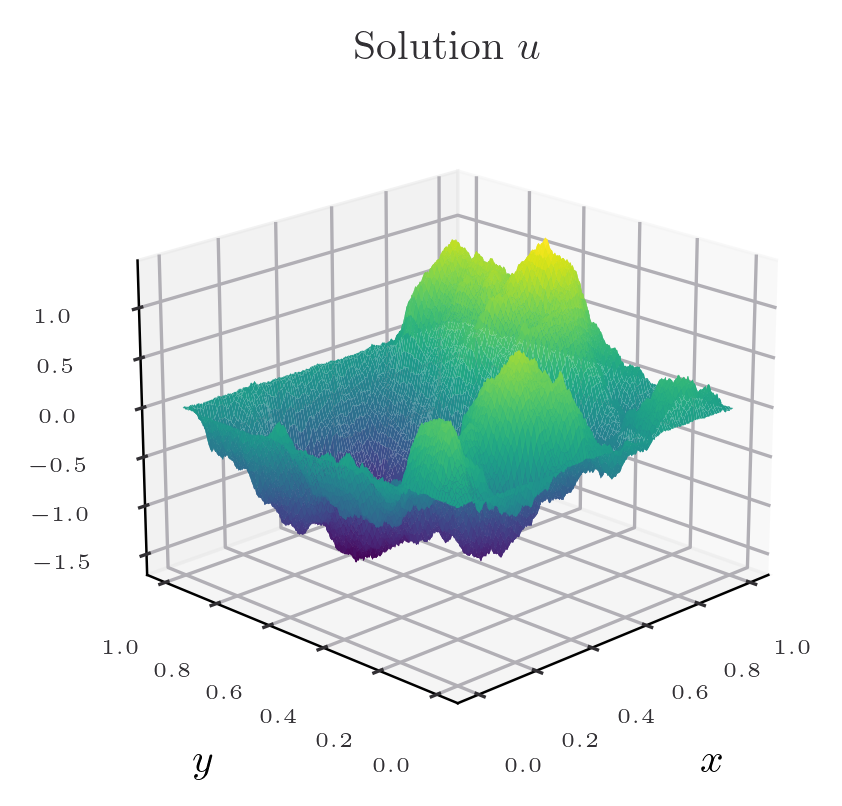

In [18]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

stride = 10
ax.plot_surface(X, Y, u_values,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"Solution $u$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

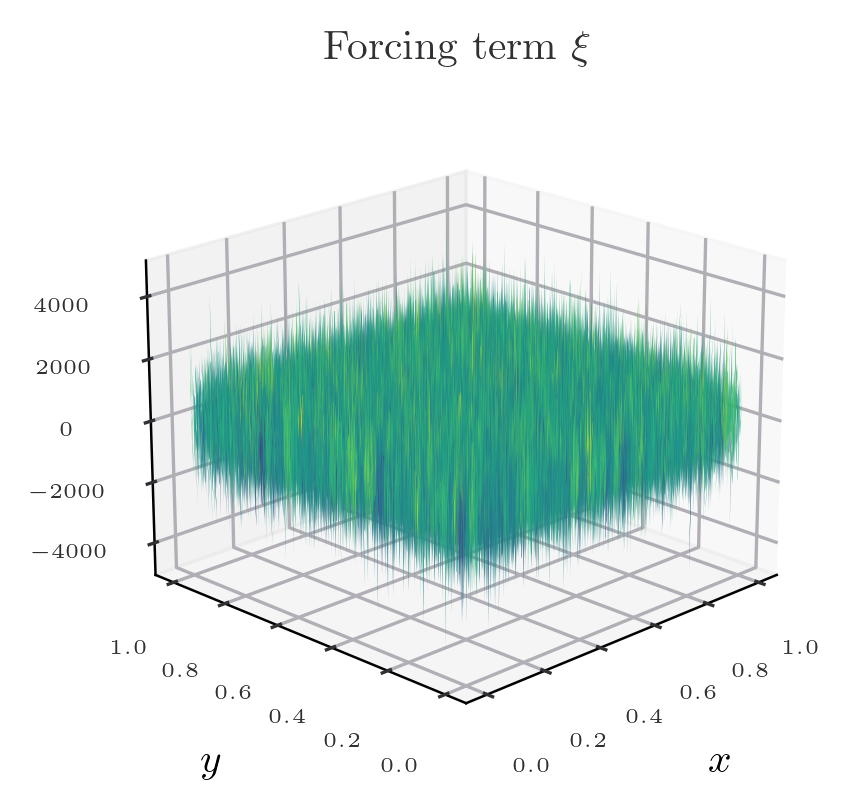

In [19]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

ax.plot_surface(X, Y, f_values,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"Forcing term $\xi$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

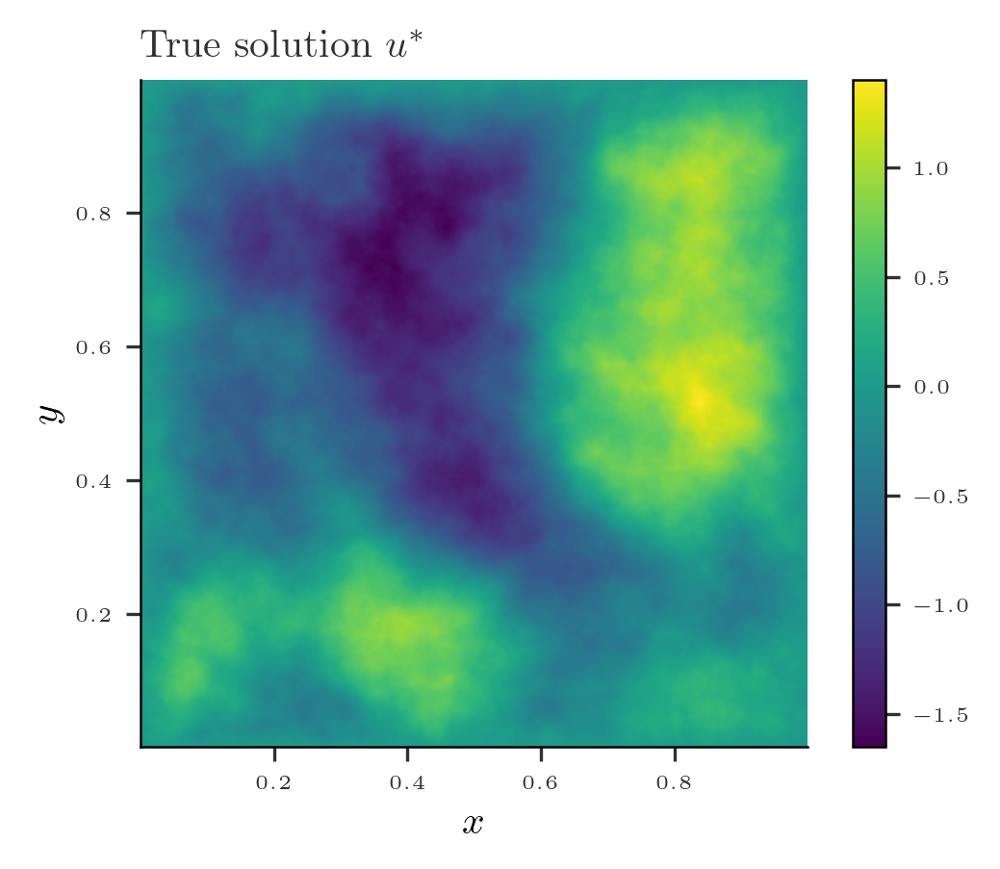

In [20]:
fig = plt.figure(figsize=(width, height))

plt.imshow(u_values[::-1, :], cmap='viridis', extent=[x_finest.min(), x_finest.max(), y_finest.min(), y_finest.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'True solution $u^*$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

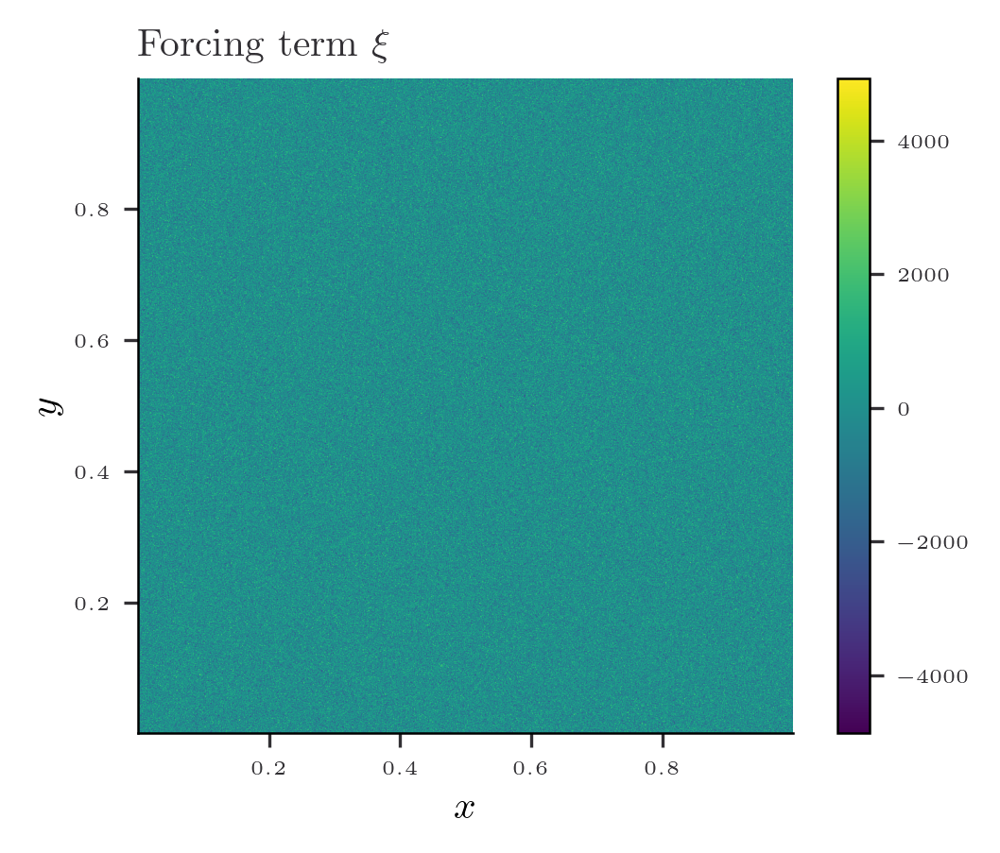

In [21]:
fig = plt.figure(figsize=(width, height))

plt.imshow(f_values[::-1, :], cmap='viridis', extent=[x_finest.min(), x_finest.max(), y_finest.min(), y_finest.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'Forcing term $\xi$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

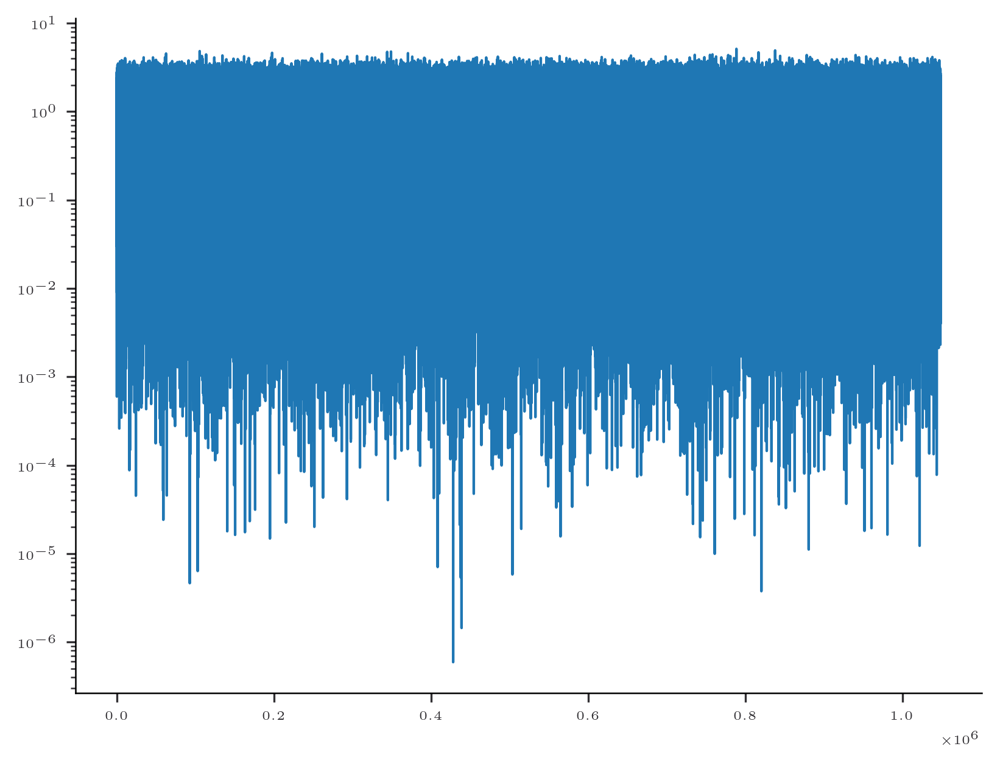

In [22]:
plt.plot(jnp.abs(coef_f.reshape(-1)), label = "f")
plt.yscale("log")
plt.show()

In [23]:
lower = 0.0
upper = 1.0
domain = jnp.array([lower,upper])


# 2d grid 
n_points = 2**6
print("Number of points {} ({} measurements)".format(n_points, n_points**2))
x = jnp.linspace(lower, upper, n_points + 1, endpoint=False)[1:] # remember to not include the points 0 and 1
y = jnp.linspace(lower, upper, n_points + 1, endpoint=False)[1:]
X, Y = jnp.meshgrid(x, y)

# Use meshgrid to create the grid of pairs
A, B = jnp.meshgrid(x, x, indexing='ij')

# Combine A and B into pairs
interior = jnp.stack((A, B), axis=-1).reshape(-1, 2)
print(interior.shape)

Number of points 64 (4096 measurements)
(4096, 2)


In [24]:
# Create the boundary

# Create a boundary
# Boundary points
boundary = jnp.hstack([jnp.zeros(1), x, jnp.zeros(1)])
n_boundary = boundary.shape[0]
print("Number of boundary points: {} ({} total)".format(n_boundary, n_boundary*4))

boundary_points = []
# Creat a discretization of the boundary
for i in [0,1]:
    boundary_points.append(jnp.stack([jnp.zeros(n_boundary) + i, boundary], axis=-1))
for i in [0,1]:
    boundary_points.append(jnp.stack([boundary, jnp.zeros(n_boundary) + i], axis=-1))
    

boundary_points = jnp.concatenate(boundary_points, axis=0)
boundary_condition = jnp.zeros(shape = boundary_points.shape[0])

Number of boundary points: 66 (264 total)


In [25]:
n_eval = 2**8
x_eval = jnp.linspace(lower, upper, n_eval + 1, endpoint=False)[1:] #jnp.hstack([jnp.zeros(1),jnp.linspace(lower, upper, n_eval + 1, endpoint=False)[1:], jnp.zeros(1)])
y_eval = jnp.linspace(lower, upper, n_eval + 1, endpoint=False)[1:] #jnp.hstack([jnp.zeros(1),jnp.linspace(lower, upper, n_eval + 1, endpoint=False)[1:], jnp.zeros(1)])
X, Y = jnp.meshgrid(x_eval, y_eval)

interior_eval = create_interior(x_eval, y_eval)

ratio = int(n_coef/n_eval)
u_eval = u_values[::ratio, ::ratio]


In [26]:
f_observed =  coef_f[:n_points,:n_points]
b_matrix = vmap_b(x, y)
b_matrix_linear = jnp.copy(b_matrix)

In [27]:
u_grid = u_values[::int(n_coef/n_points), ::int(n_coef/n_points)]

In [28]:
def Gauss_Newton(f, boundary_condition, b_matrix_linear,boundary_points, x,y,length_scale, nu, n_iter, s_decay, reg, reg_bc):
    b_matrix = jnp.copy(b_matrix_linear)
    r_n = f
    n_points = f.shape[0]
    previous_error = jnp.inf
    
    for i in range(n_iter):
        print("Current iteration {}, current error {}".format(i+1, previous_error))

        # Build the matrix and sovle the system
        theta, theta_11, theta_12_dst, theta_22_dst = build_matrices(boundary_points,x,y,length_scale, b_matrix, nu)
        alpha = solve(theta, boundary_condition, r_n, s_decay, reg_bc = reg_bc, reg = reg)

        # Evaluate on the grid
        pred_grid, pred = predict(alpha, x, y, x,y, boundary_points, length_scale, nu, b_matrix)

        # Evaluate the DST transform of  negative laplacian 
        K_laplacian_dst = jnp.vstack([theta_12_dst, theta_22_dst]).T
        L_dst = K_laplacian_dst@alpha

        # Compute the discrepancy with f
        error = jnp.linalg.norm(L_dst + compute_sine_coef_2d(tau(pred_grid)).reshape(n_points*n_points) - f.reshape(n_points*n_points))/jnp.linalg.norm(f.reshape(n_points*n_points))

        if jnp.abs(previous_error - error)/jnp.abs(error) < 1e-10:
            print("Converged at iteration {} with error {}".format(i+1, error))
            break
            
        previous_error = error


        if i < n_iter-1:
            # Compute the linearization
            linearization = tau_prime(pred_grid)*pred_grid - tau(pred_grid)
            # Project on the sine basis
            linearization = compute_sine_coef_2d(linearization)
            # Compute the residual
            r_n = f + linearization

            # Compute the new coefficent b
            b_matrix = b_matrix_linear + tau_prime(pred_grid)
    return alpha, b_matrix, r_n
    

In [29]:
length_scale = 1.25

## $L^2$ norm


In [30]:
nu

0.1

In [31]:
f_observed.shape

(64, 64)

In [32]:
s_decay =0.0

In [33]:
n_iter = 1000
alpha, b_matrix, r =  Gauss_Newton(f_observed, boundary_condition, b_matrix_linear,boundary_points, x,y,length_scale, nu, n_iter, s_decay = s_decay, reg = 1e-9, reg_bc = 1e-12)

Current iteration 1, current error inf
Current iteration 2, current error 0.010558148464185695
Current iteration 3, current error 0.024611905585735807
Current iteration 4, current error 0.02323712249802426
Current iteration 5, current error 0.0227783943232174
Current iteration 6, current error 0.022571927995285374
Current iteration 7, current error 0.022498037797394142
Current iteration 8, current error 0.022472867041927698
Current iteration 9, current error 0.022464256997970722
Current iteration 10, current error 0.022461293576048376
Current iteration 11, current error 0.022460270582731163
Current iteration 12, current error 0.022459918021553407
Current iteration 13, current error 0.0224597950793235
Current iteration 14, current error 0.022459752987385027
Current iteration 15, current error 0.022459738000849317
Current iteration 16, current error 0.022459733532768568
Current iteration 17, current error 0.02245973119023688
Current iteration 18, current error 0.022459731100730317
Curren

In [34]:
pred_grid, pred= predict(alpha, x_eval, y_eval, x,y, boundary_points, length_scale, nu, b_matrix)

In [35]:
norm_diff = jnp.sqrt(integrate.trapezoid(integrate.trapezoid((pred_grid - u_eval)**2, x_eval), y_eval))
norm_u = jnp.sqrt(integrate.trapezoid(integrate.trapezoid(u_eval**2, x_eval), y_eval))
print(norm_diff, norm_diff/norm_u)

0.08168404656184283 0.12090456997147182


In [36]:
pred_grid.shape

(256, 256)

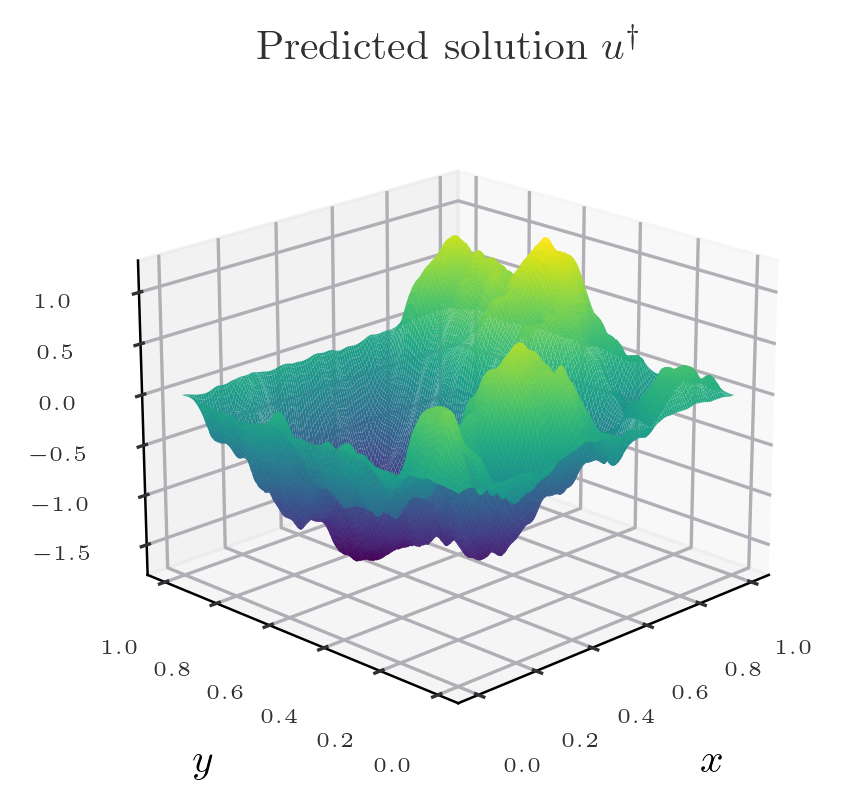

In [37]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

stride = 2
ax.plot_surface(X, Y, pred_grid,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"Predicted solution $u^\dagger$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

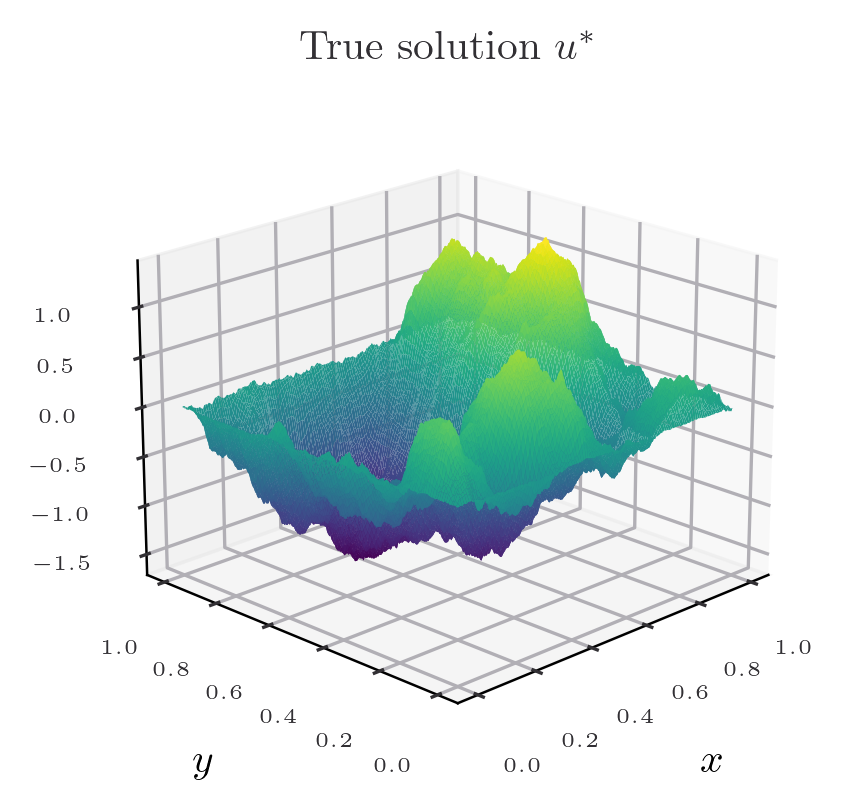

In [38]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

ax.plot_surface(X, Y, u_eval,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"True solution $u^*$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

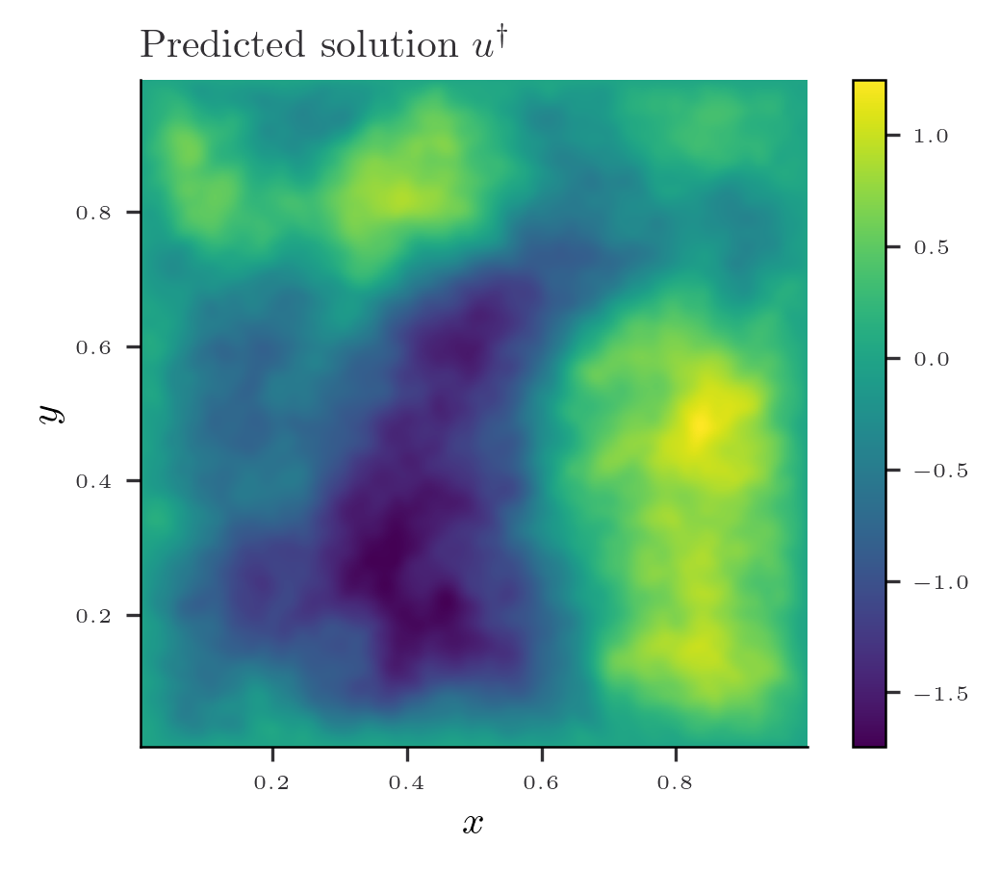

In [39]:
fig = plt.figure(figsize=(width, height))

plt.imshow(pred_grid, cmap='viridis', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'Predicted solution $u^\dagger$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

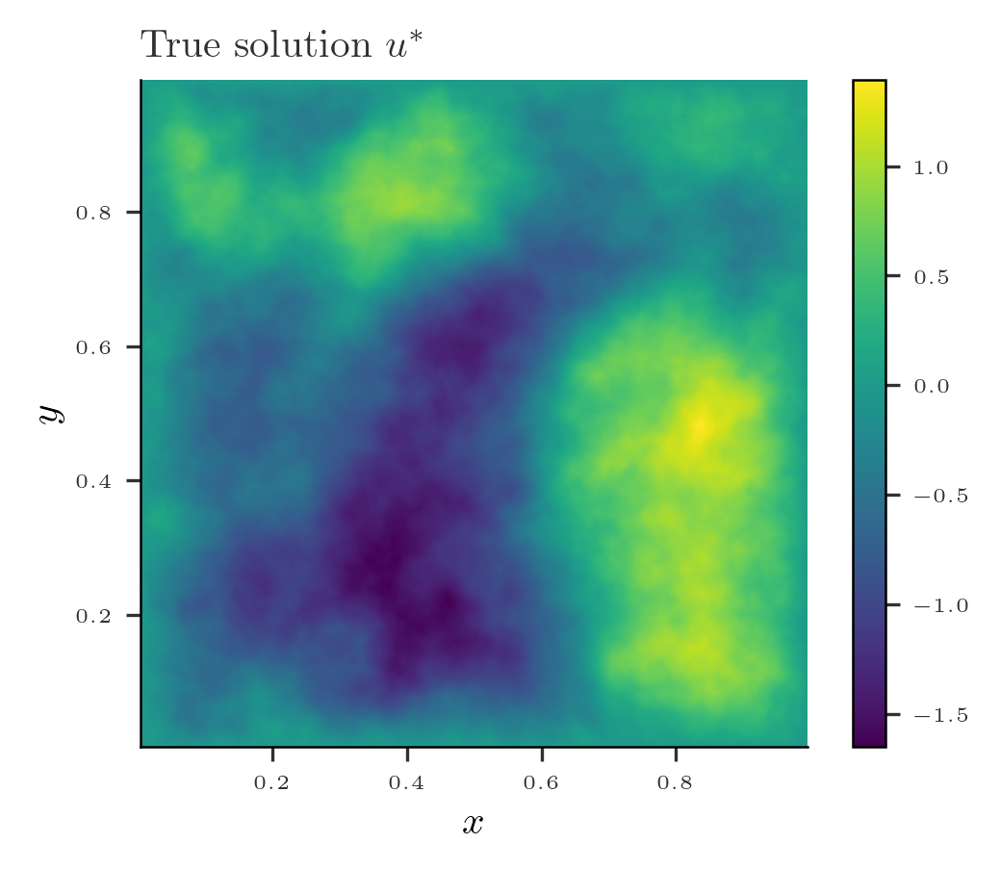

In [40]:
fig = plt.figure(figsize=(width, height))

plt.imshow(u_eval, cmap='viridis', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'True solution $u^*$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

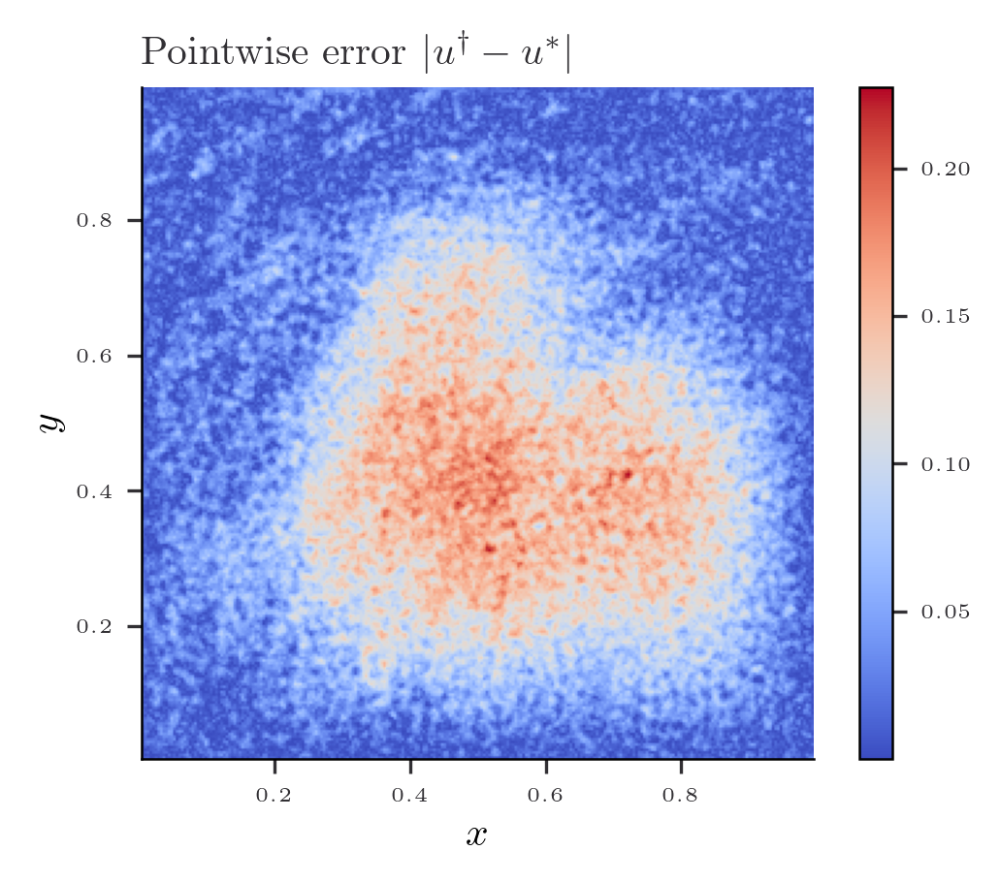

In [41]:
fig = plt.figure(figsize=(width, height))

plt.imshow(jnp.abs(pred_grid - u_eval), cmap='coolwarm', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'Pointwise error $|u^\dagger - u^*|$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

## $H^{0.5}$ norm


In [42]:
length_scale = 1.25
nu

0.1

In [43]:
f_observed.shape

(64, 64)

In [44]:
s_decay =0.5

In [45]:
n_iter = 1000
alpha, b_matrix, r =  Gauss_Newton(f_observed, boundary_condition, b_matrix_linear,boundary_points, x,y,length_scale, nu, n_iter, s_decay = s_decay, reg = 1e-9, reg_bc = 1e-12)

Current iteration 1, current error inf
Current iteration 2, current error 0.029427445864043122
Current iteration 3, current error 0.037012788280568934
Current iteration 4, current error 0.03609442660521074
Current iteration 5, current error 0.03579048667830304
Current iteration 6, current error 0.03565067525383053
Current iteration 7, current error 0.03559857921595684
Current iteration 8, current error 0.03558017305267989
Current iteration 9, current error 0.035573700480405084
Current iteration 10, current error 0.035571421677812666
Current iteration 11, current error 0.03557061918621366
Current iteration 12, current error 0.03557033557636677
Current iteration 13, current error 0.03557023628116585
Current iteration 14, current error 0.03557020079710735
Current iteration 15, current error 0.035570188524620835
Current iteration 16, current error 0.03557018430317457
Current iteration 17, current error 0.03557018234636048
Current iteration 18, current error 0.03557018240586744
Current iter

In [46]:
pred_grid, pred= predict(alpha, x_eval, y_eval, x,y, boundary_points, length_scale, nu, b_matrix)

In [47]:
norm_diff = jnp.sqrt(integrate.trapezoid(integrate.trapezoid((pred_grid - u_eval)**2, x_eval), y_eval))
norm_u = jnp.sqrt(integrate.trapezoid(integrate.trapezoid(u_eval**2, x_eval), y_eval))
print(norm_diff, norm_diff/norm_u)

0.07805225083338128 0.11552897070507862


In [48]:
pred_grid.shape

(256, 256)

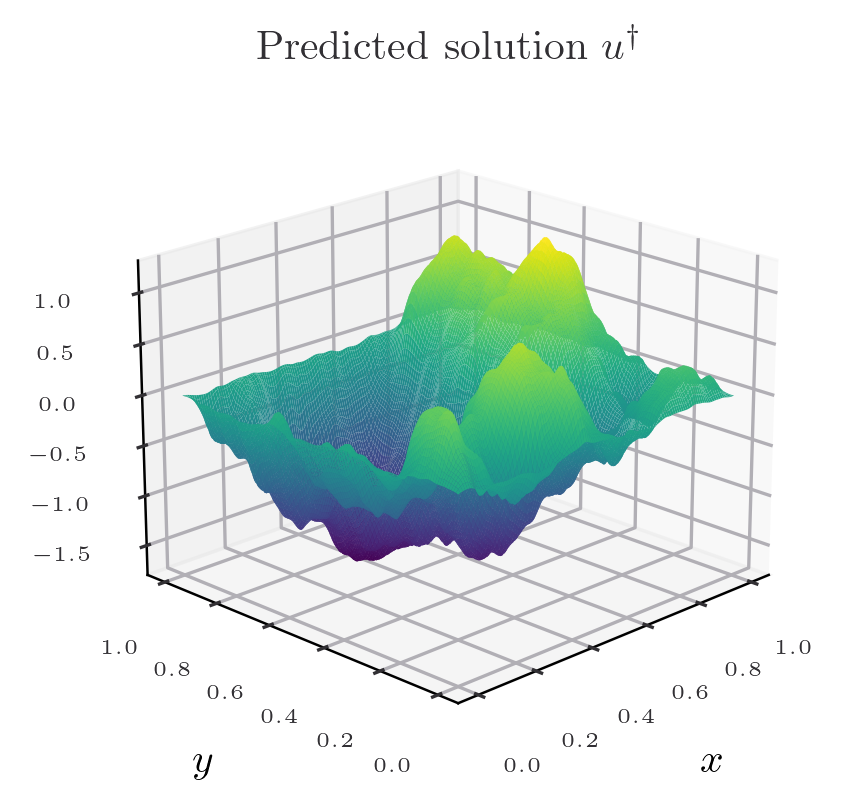

In [49]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

stride = 2
ax.plot_surface(X, Y, pred_grid,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"Predicted solution $u^\dagger$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

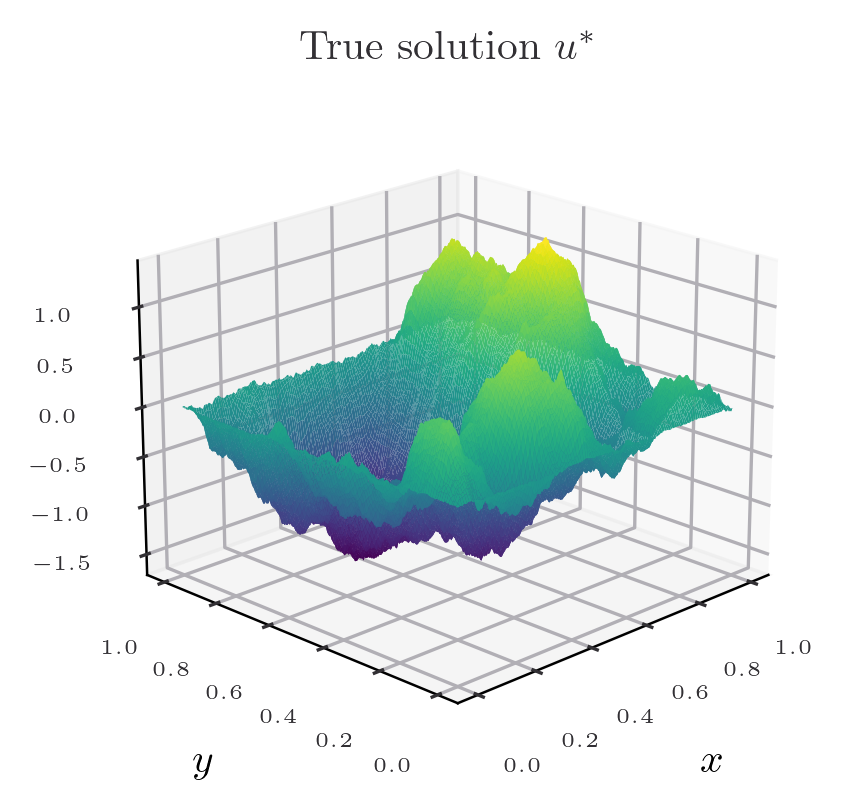

In [50]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

ax.plot_surface(X, Y, u_eval,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"True solution $u^*$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

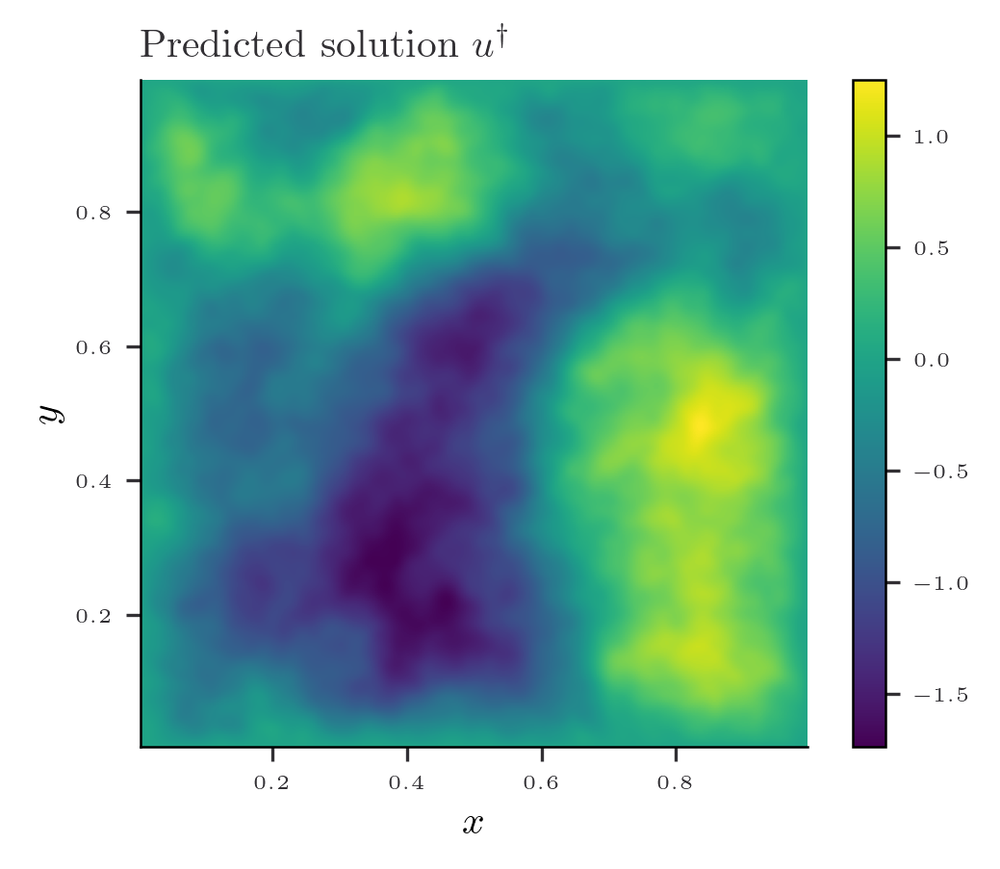

In [51]:
fig = plt.figure(figsize=(width, height))

plt.imshow(pred_grid, cmap='viridis', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'Predicted solution $u^\dagger$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

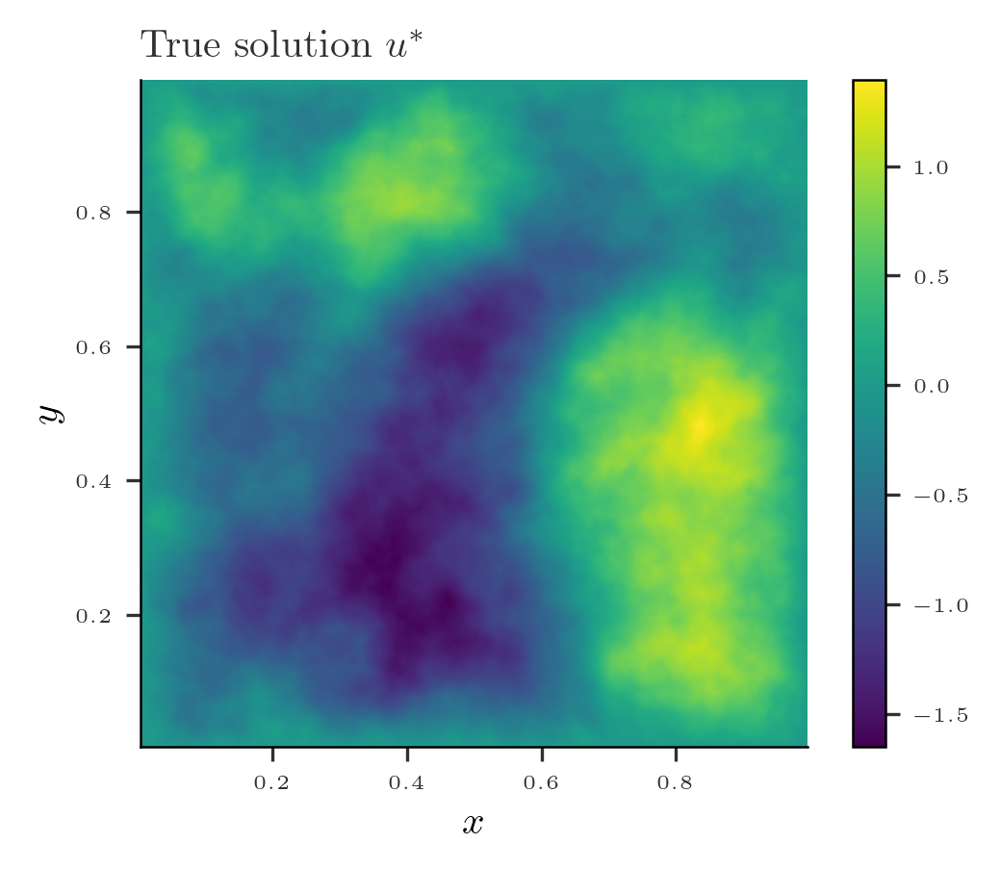

In [52]:
fig = plt.figure(figsize=(width, height))

plt.imshow(u_eval, cmap='viridis', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'True solution $u^*$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

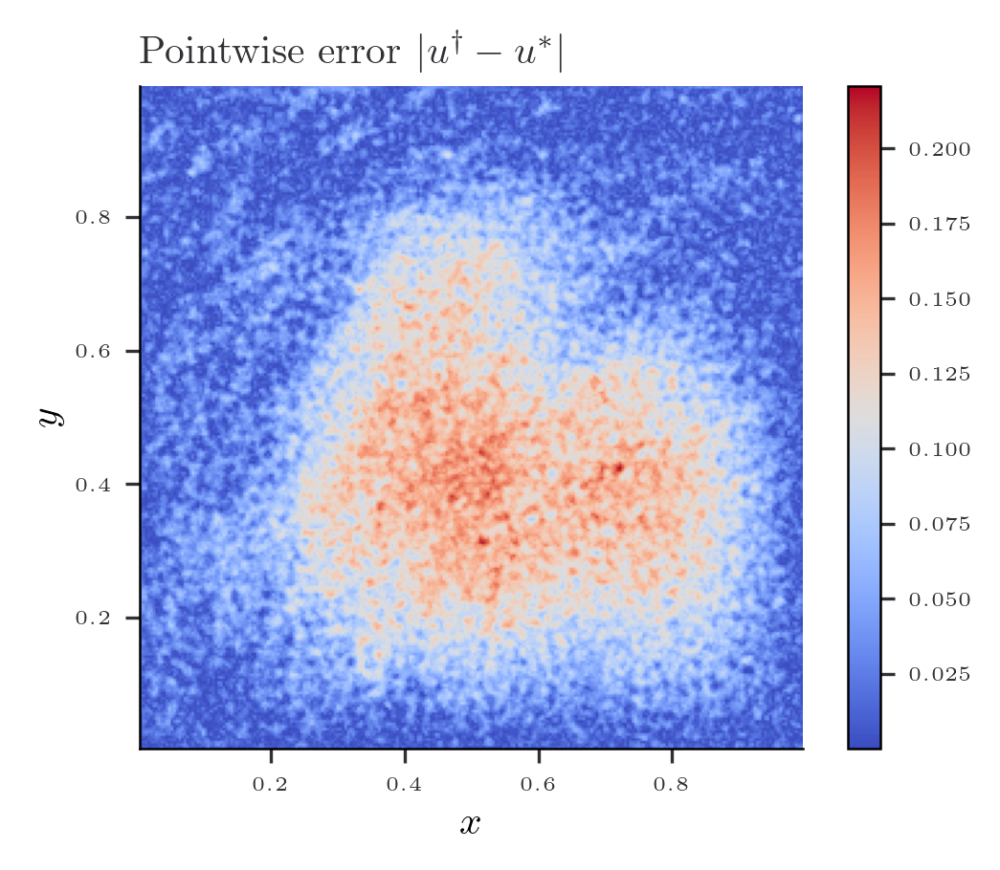

In [53]:
fig = plt.figure(figsize=(width, height))

plt.imshow(jnp.abs(pred_grid - u_eval), cmap='coolwarm', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'Pointwise error $|u^\dagger - u^*|$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

## $H^1$ norm


In [54]:
nu

0.1

In [55]:
f_observed.shape

(64, 64)

In [56]:
s_decay =1.0

In [57]:
n_iter = 100
alpha, b_matrix, r =  Gauss_Newton(f_observed, boundary_condition, b_matrix_linear,boundary_points, x,y,length_scale, nu, n_iter, s_decay = s_decay, reg = 1e-9, reg_bc = 1e-12)

Current iteration 1, current error inf
Current iteration 2, current error 0.5345806706930685
Current iteration 3, current error 0.5351661079049973
Current iteration 4, current error 0.5350874798377938


Current iteration 5, current error 0.5350748749581286
Current iteration 6, current error 0.5350705933511123
Current iteration 7, current error 0.5350692821446374
Current iteration 8, current error 0.5350688857444693
Current iteration 9, current error 0.5350687663114204
Current iteration 10, current error 0.5350687303760328
Current iteration 11, current error 0.5350687195534293
Current iteration 12, current error 0.5350687162882132
Current iteration 13, current error 0.5350687153338624
Current iteration 14, current error 0.5350687150213959
Current iteration 15, current error 0.5350687149323052
Converged at iteration 15 with error 0.5350687149206362


In [58]:
pred_grid, pred= predict(alpha, x_eval, y_eval, x,y, boundary_points, length_scale, nu, b_matrix)

In [59]:
norm_diff = jnp.sqrt(integrate.trapezoid(integrate.trapezoid((pred_grid - u_eval)**2, x_eval), y_eval))
norm_u = jnp.sqrt(integrate.trapezoid(integrate.trapezoid(u_eval**2, x_eval), y_eval))
print(norm_diff, norm_diff/norm_u)

0.03111518918719574 0.04605512002163987


In [60]:
pred_grid.shape

(256, 256)

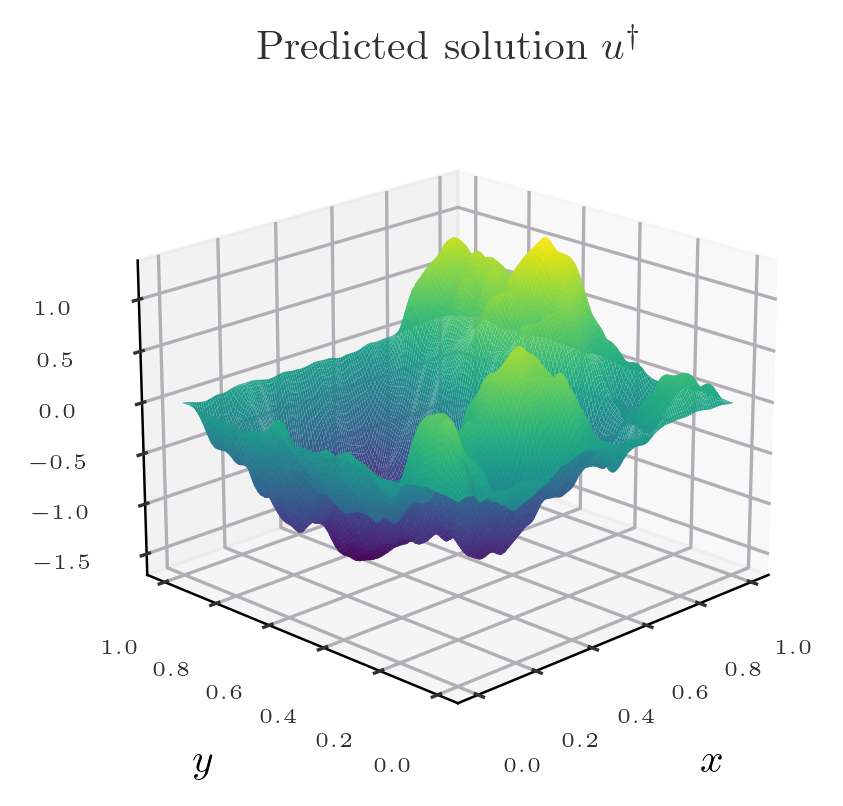

In [61]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

stride = 2
ax.plot_surface(X, Y, pred_grid,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"Predicted solution $u^\dagger$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

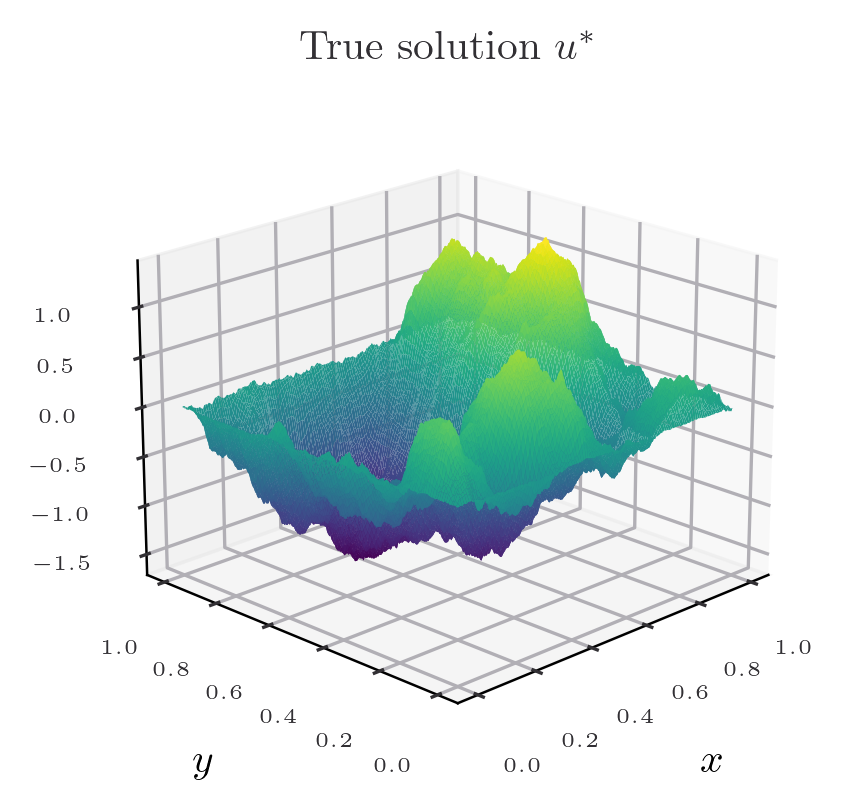

In [62]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

ax.plot_surface(X, Y, u_eval,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"True solution $u^*$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

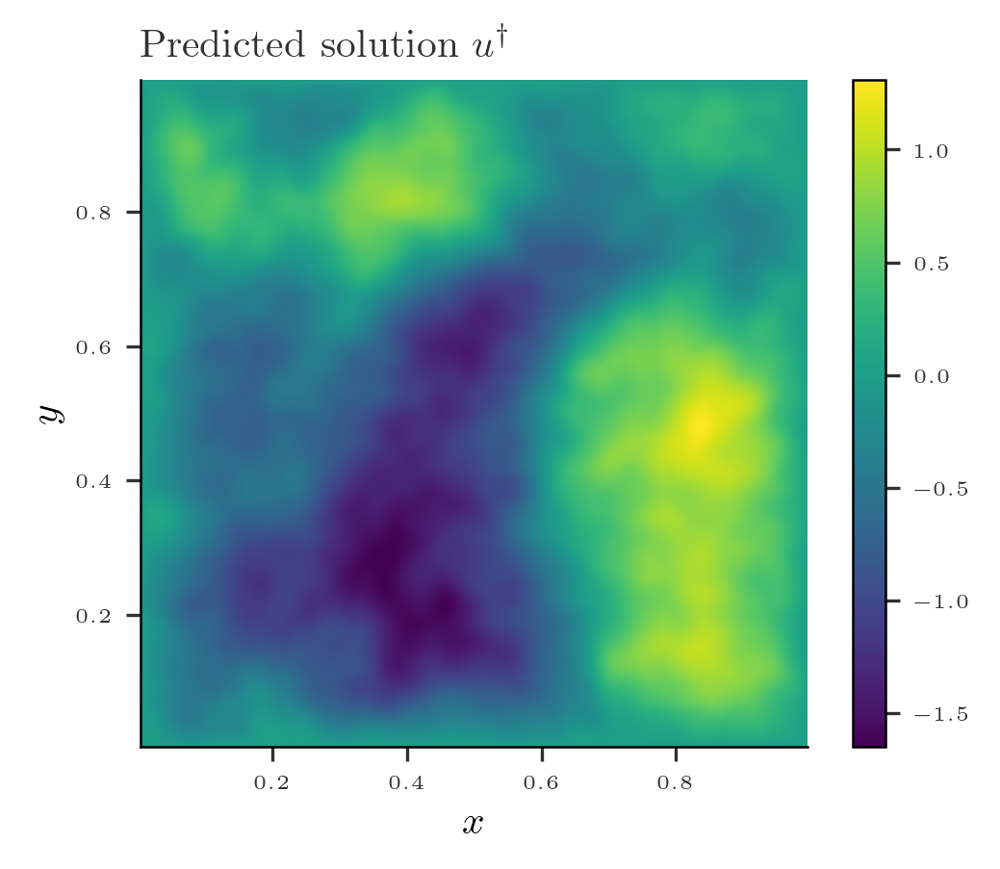

In [63]:
fig = plt.figure(figsize=(width, height))

plt.imshow(pred_grid, cmap='viridis', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'Predicted solution $u^\dagger$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

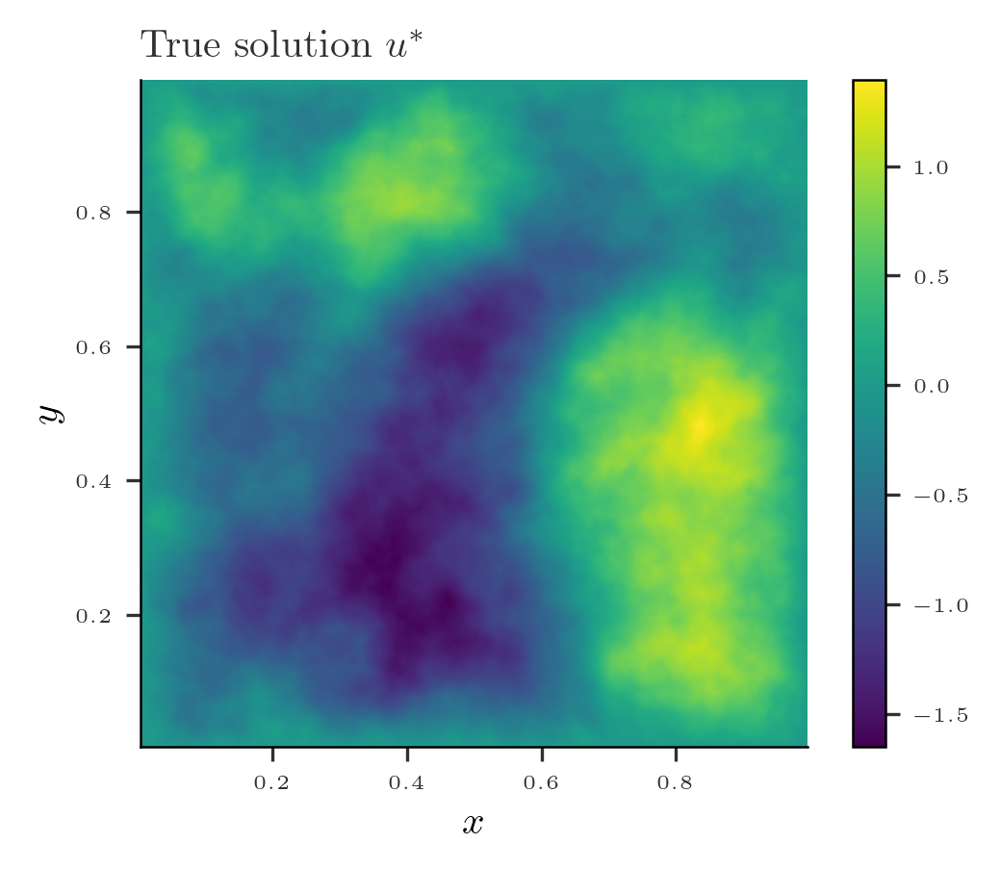

In [64]:
fig = plt.figure(figsize=(width, height))

plt.imshow(u_eval, cmap='viridis', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'True solution $u^*$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

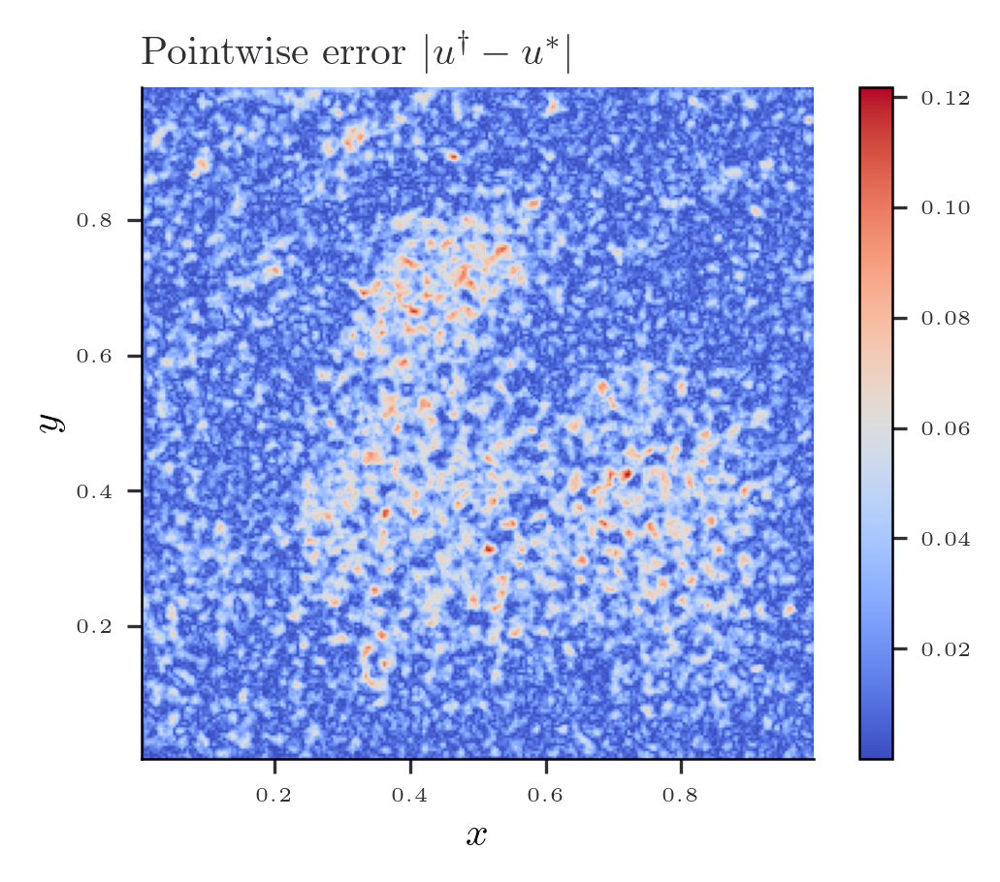

In [65]:
fig = plt.figure(figsize=(width, height))

plt.imshow(jnp.abs(pred_grid - u_eval), cmap='coolwarm', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'Pointwise error $|u^\dagger - u^*|$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

## $H^{1.1}$ norm


In [66]:
nu

0.1

In [67]:
f_observed.shape

(64, 64)

In [68]:
s_decay =1.1

In [69]:
n_iter = 100
alpha, b_matrix, r =  Gauss_Newton(f_observed, boundary_condition, b_matrix_linear,boundary_points, x,y,length_scale, nu, n_iter, s_decay = s_decay, reg = 1e-9, reg_bc = 1e-12)

Current iteration 1, current error inf
Current iteration 2, current error 0.6632216544244462
Current iteration 3, current error 0.6637056996039046
Current iteration 4, current error 0.6636423373614923
Current iteration 5, current error 0.6636356690065134
Current iteration 6, current error 0.6636339778745726
Current iteration 7, current error 0.6636335962950514
Current iteration 8, current error 0.6636335108797606
Current iteration 9, current error 0.6636334917755699
Current iteration 10, current error 0.6636334875115387
Current iteration 11, current error 0.6636334865513879
Current iteration 12, current error 0.6636334863494442
Converged at iteration 12 with error 0.6636334862893278


In [70]:
pred_grid, pred= predict(alpha, x_eval, y_eval, x,y, boundary_points, length_scale, nu, b_matrix)

In [71]:
norm_diff = jnp.sqrt(integrate.trapezoid(integrate.trapezoid((pred_grid - u_eval)**2, x_eval), y_eval))
norm_u = jnp.sqrt(integrate.trapezoid(integrate.trapezoid(u_eval**2, x_eval), y_eval))
print(norm_diff, norm_diff/norm_u)

0.027650548909532353 0.04092693574933412


In [72]:
pred_grid.shape

(256, 256)

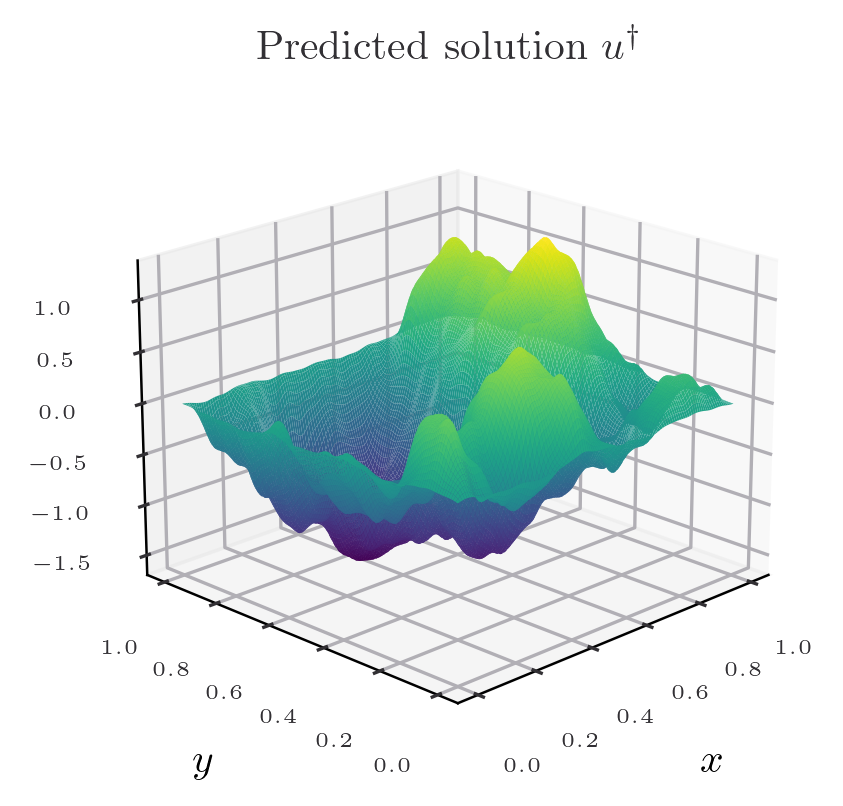

In [73]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

stride = 2
ax.plot_surface(X, Y, pred_grid,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"Predicted solution $u^\dagger$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

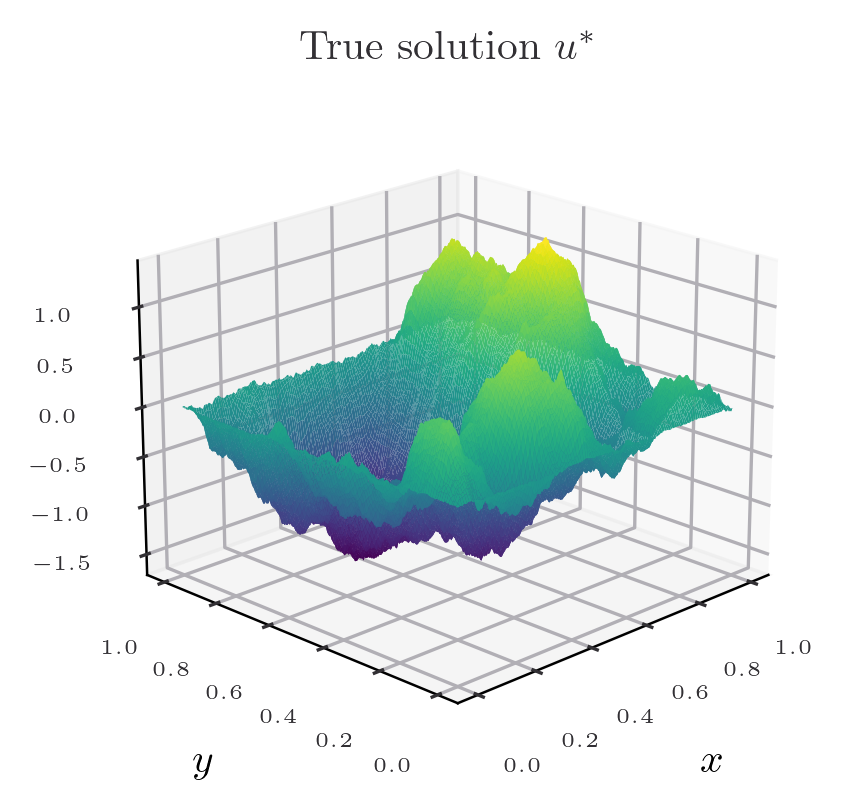

In [74]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

ax.plot_surface(X, Y, u_eval,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"True solution $u^*$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

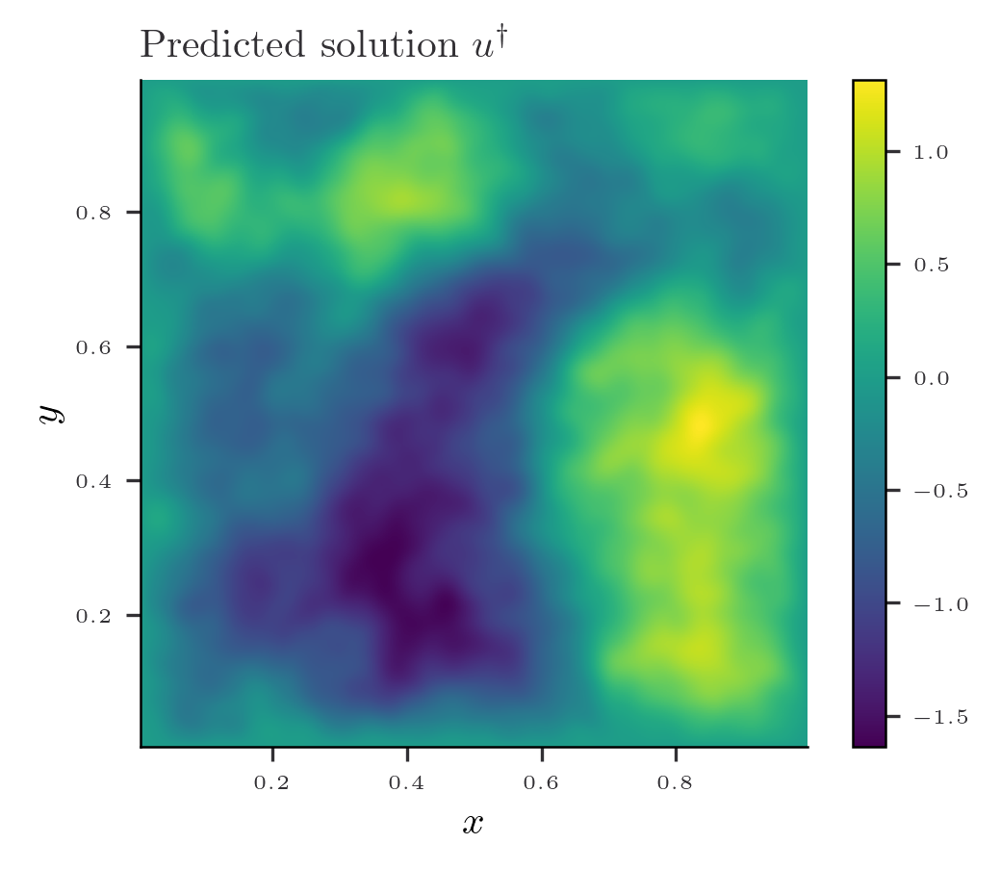

In [75]:
fig = plt.figure(figsize=(width, height))

plt.imshow(pred_grid, cmap='viridis', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'Predicted solution $u^\dagger$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

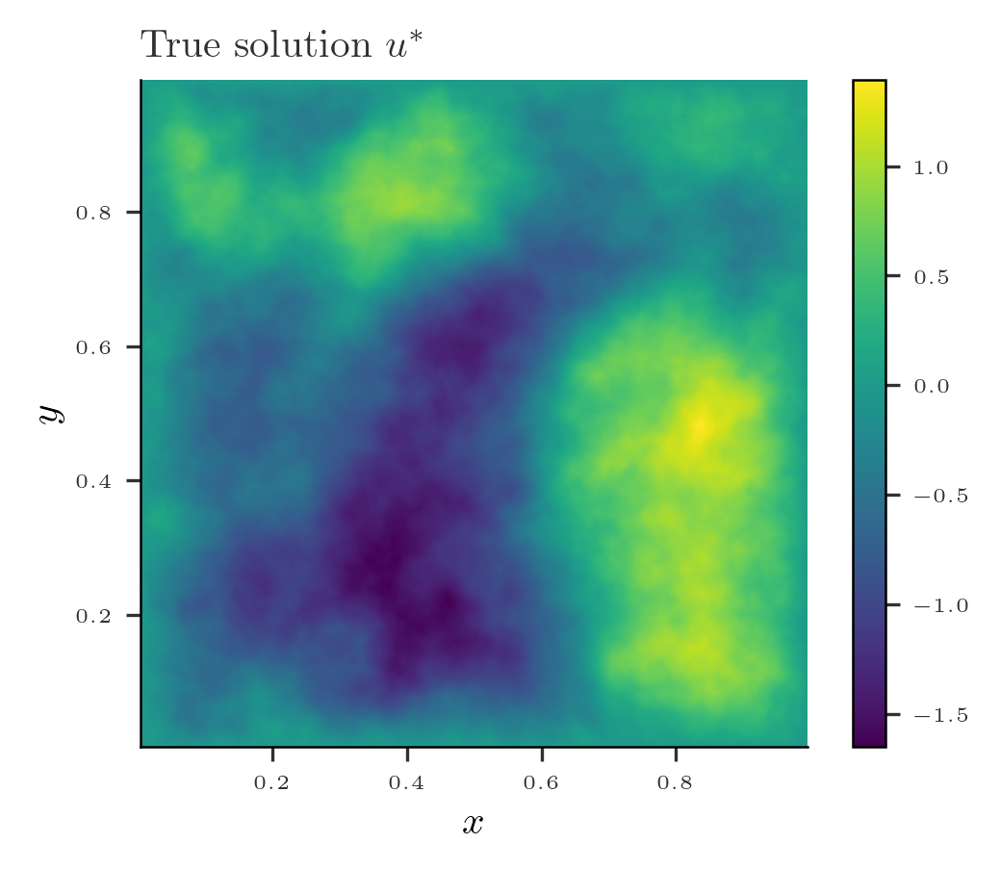

In [76]:
fig = plt.figure(figsize=(width, height))

plt.imshow(u_eval, cmap='viridis', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'True solution $u^*$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

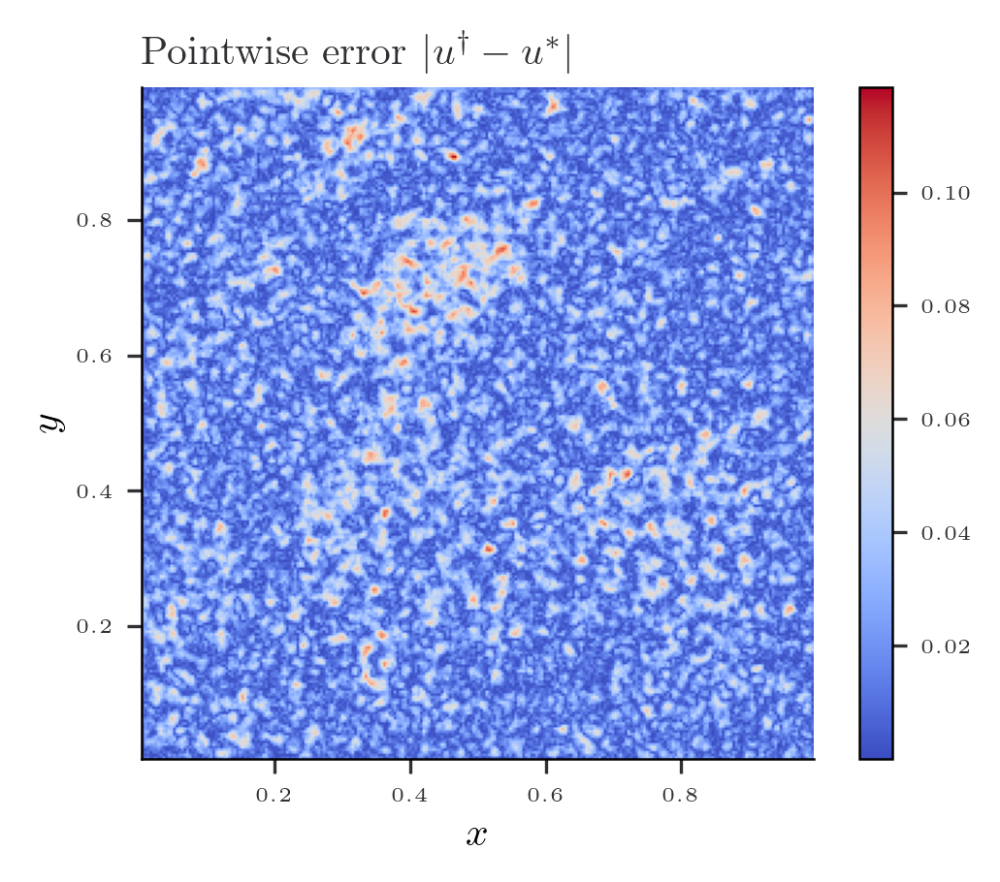

In [77]:
fig = plt.figure(figsize=(width, height))

plt.imshow(jnp.abs(pred_grid - u_eval), cmap='coolwarm', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'Pointwise error $|u^\dagger - u^*|$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

## $H^2$ norm


In [80]:
s_decay =2.0

In [81]:
n_iter = 100
alpha, b_matrix, r =  Gauss_Newton(f_observed, boundary_condition, b_matrix_linear,boundary_points, x,y,length_scale, nu, n_iter, s_decay = s_decay, reg = 1e-9, reg_bc = 1e-12)

Current iteration 1, current error inf
Current iteration 2, current error 0.9634249286430302
Current iteration 3, current error 0.9636875144507636
Current iteration 4, current error 0.9636470630421392
Current iteration 5, current error 0.9636476664460839
Current iteration 6, current error 0.9636476631550523
Converged at iteration 6 with error 0.9636476631627647


In [82]:
pred_grid, pred= predict(alpha, x_eval, y_eval, x,y, boundary_points, length_scale, nu, b_matrix)

In [83]:
norm_diff = jnp.sqrt(integrate.trapezoid(integrate.trapezoid((pred_grid - u_eval)**2, x_eval), y_eval))
norm_u = jnp.sqrt(integrate.trapezoid(integrate.trapezoid(u_eval**2, x_eval), y_eval))
print(norm_diff, norm_diff/norm_u)

0.05335758111112683 0.07897717694573989


In [84]:
pred_grid.shape

(256, 256)

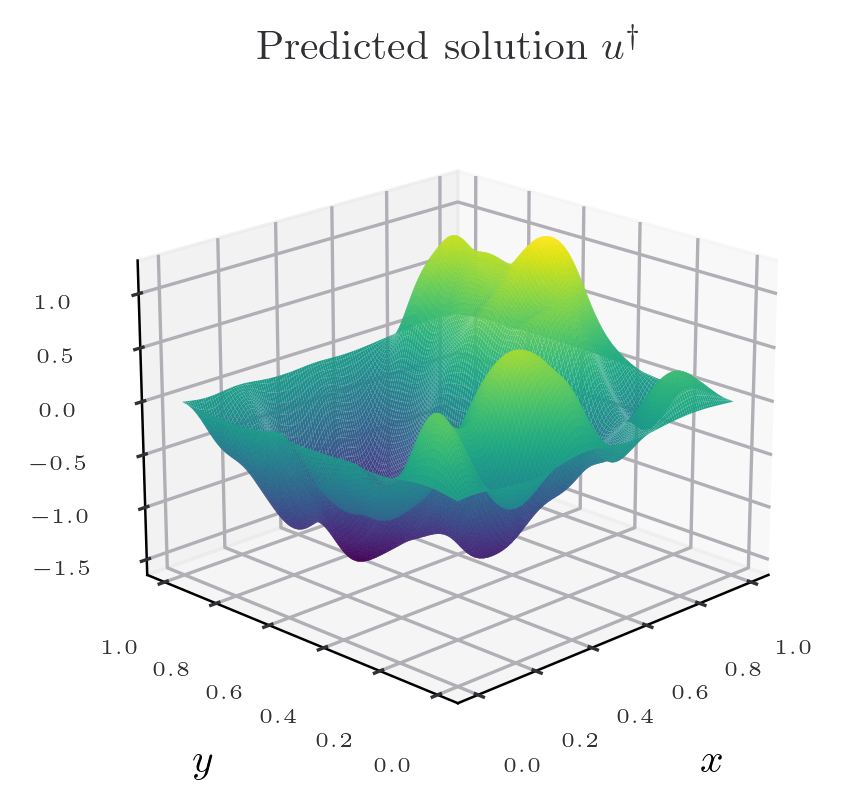

In [85]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

stride = 2
ax.plot_surface(X, Y, pred_grid,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"Predicted solution $u^\dagger$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

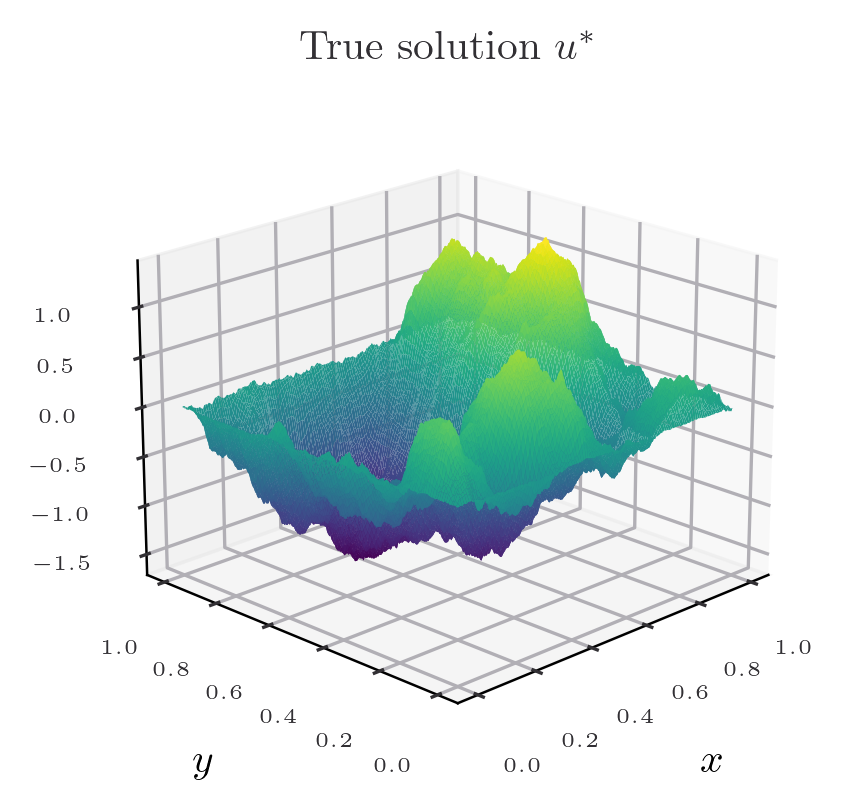

In [86]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

ax.plot_surface(X, Y, u_eval,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"True solution $u^*$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

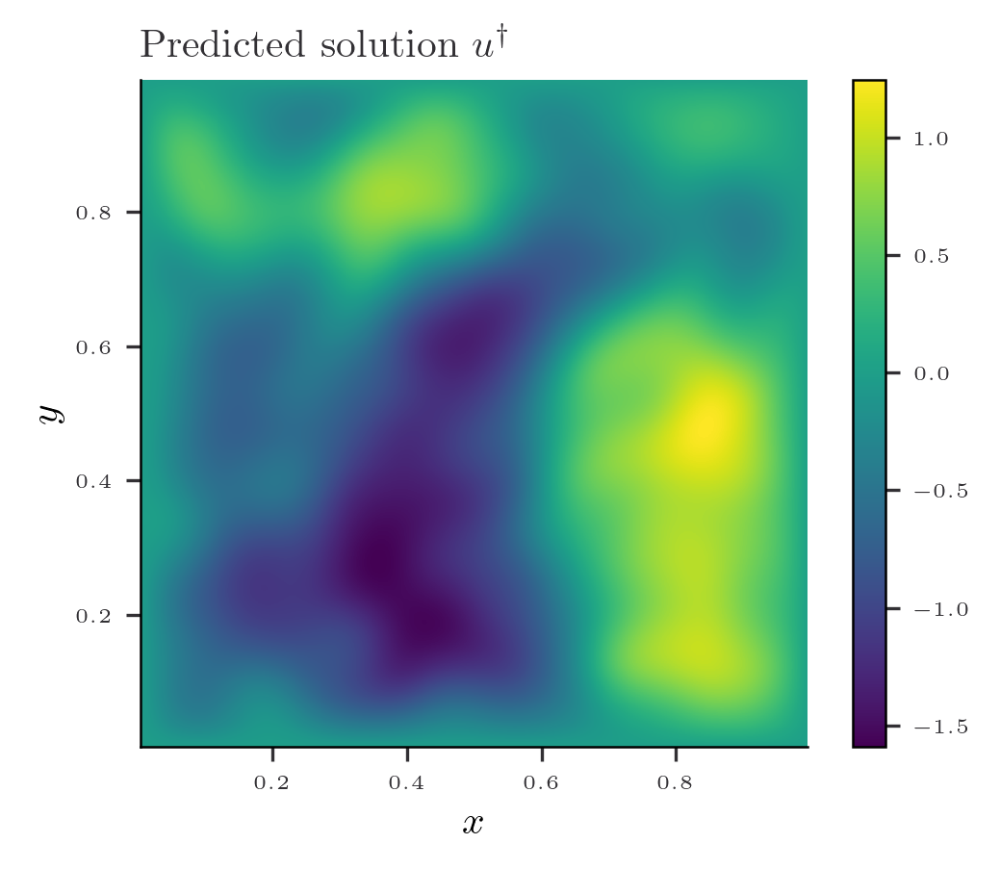

In [87]:
fig = plt.figure(figsize=(width, height))

plt.imshow(pred_grid, cmap='viridis', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'Predicted solution $u^\dagger$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

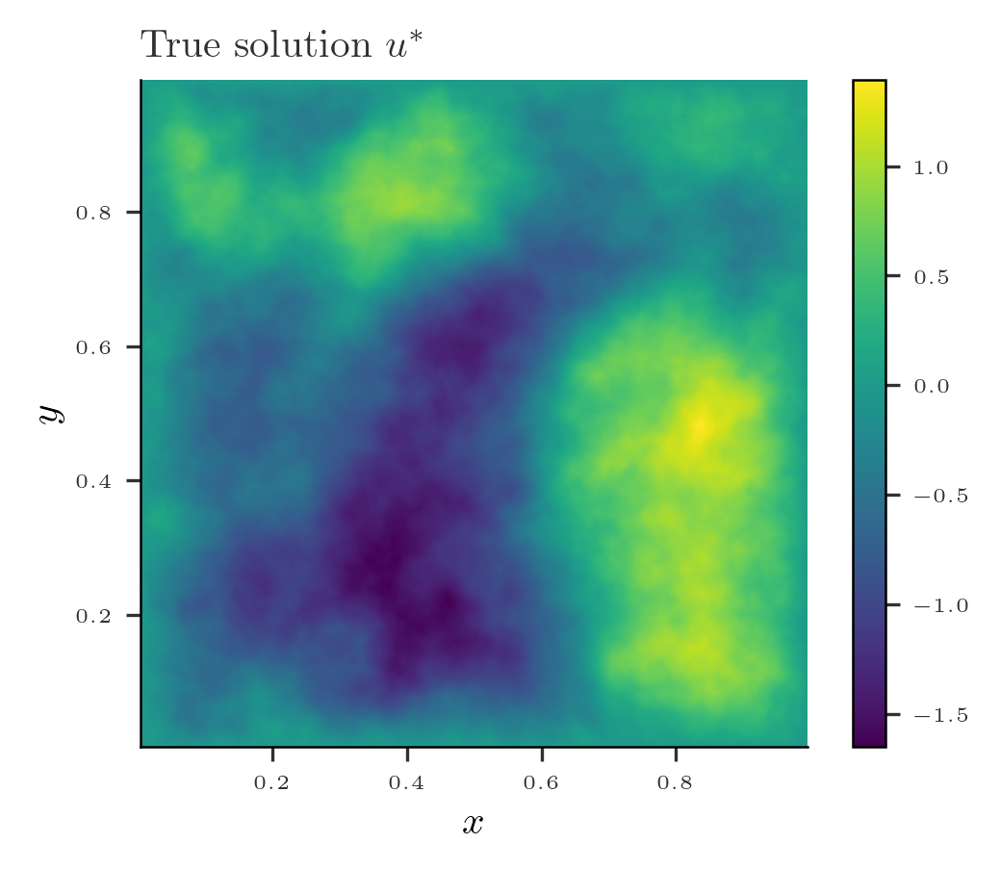

In [88]:
fig = plt.figure(figsize=(width, height))

plt.imshow(u_eval, cmap='viridis', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'True solution $u^*$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

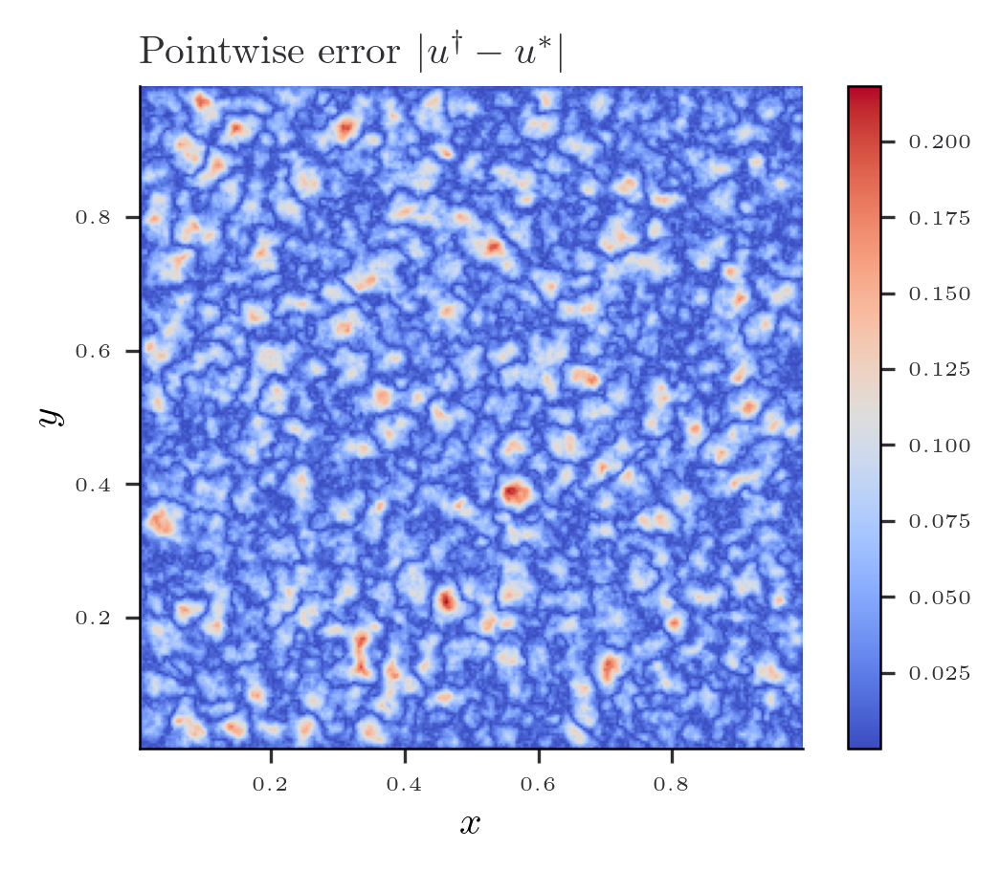

In [89]:
fig = plt.figure(figsize=(width, height))

plt.imshow(jnp.abs(pred_grid - u_eval), cmap='coolwarm', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'Pointwise error $|u^\dagger - u^*|$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()